### <h1 style="background-color:#1a3afe;color:#efff7e;text-align: center;padding-top: 5px;padding-bottom: 5px;border-radius: 15px 50px;"><strong><centre>Shift Invariance Can Reduce Adversarial Robustness </centre></strong></h1>

The aim of this paper by  Songwei Ge,Vasu Singla, R. Basri and David Jacobs, is to show that shift invariance which is a useful property of CNNs can lead to greater sensitivity to adversarial attacks.

### <h3 style="background-color:#56cbf9;color:white;text-align: center;padding-top: 5px;padding-bottom: 5px;border-radius: 15px 50px;"><strong><centre>Simple example: white vs black dot on a gray background </centre></strong></h3>

The first experiment is a simple example, a two-class classification problem. Each class consists of a single image: a white or black dot on a gray background. Two types of models are trained, a fully connected (FC) network and a convolutional neural network (CNN), with the CNN designed to be fully shift-invariant.


In [1]:
import numpy as np
import tensorflow as tf
import matplotlib.pyplot as plt
from tqdm import tqdm
from functions.dots_models import *
%matplotlib inline
%load_ext autoreload
%autoreload 2

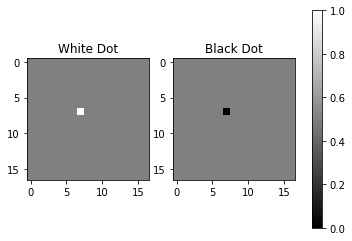

In [2]:
input_shape = (17, 17)
im_1 = np.zeros(input_shape)+0.5
im_2 = im_1.copy()
im_1[7][7]+=0.5
im_2[7][7]-=0.5

fig, axes = plt.subplots(1, 2)
cax1 = axes[0].imshow(im_1, cmap='gray', vmin=0, vmax=1)
axes[0].set_title("White Dot") #1
cax2 = axes[1].imshow(im_2, cmap='gray', vmin=0, vmax=1)
axes[1].set_title("Black Dot") #0
fig.colorbar(cax2, ax=axes)
plt.show()
# Creating dataset
data = np.stack([np.expand_dims(im_1, axis=-1), np.expand_dims(im_2, axis=-1)], axis=0)
y = np.array([1, 0])

Let's import the models from dot_models.py. The simple models are:
* fcn_model:  a Fully Connected Network (FCN) created by create_fcn, it starts with a BatchNormalization then a Flatten followed by a Dense layer of 512 units with a ReLU activation function and finally a Dense layer with 2 units and the softmax activation.

*  small_cnn_model_padding created by create_small_cnn. A simple Convolutional Neural Network (CNN) model that includes circular padding in the input. It begins with a BatchNormalization then a Lambda layer to apply circular padding. Then a Conv2D layer with 512 filters and a kernel size of 17 (k). A ReLU activation function, and lastly a Dense layer with 2 units and the softmax activation.
The previous two models are the ones used in the paper, <u>the next one is added for comparison.</u>
* <u>small_cnn_model</u> created by create_small_cnn_np (no padding) same as the previous but without the lambda padding. We added to check if shift invariance of cnn the model is a result of padding, which is mentioned in the paper.

We can show the architectures of the models visually instead.

In [5]:
from IPython.core.interactiveshell import InteractiveShell
InteractiveShell.ast_node_interactivity = "all"

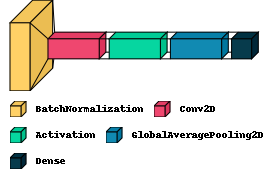

In [6]:
from PIL import ImageFont
Visual_Keras = True
# Set Visual_Keras = True to plot the keras graphs
if Visual_Keras:
    import visualkeras
else:
    from keras.utils.vis_utils import plot_model
k = 17
small_cnn_model = create_small_cnn_np(k)
if Visual_Keras:
    visualkeras.layered_view(small_cnn_model, legend=True)
else:
    plot_model(small_cnn_model, show_shapes=True, show_layer_names=True)


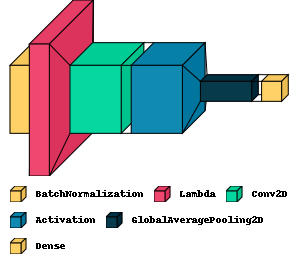

In [7]:
small_cnn_model_padding = create_small_cnn(k)
if Visual_Keras:
    visualkeras.layered_view(small_cnn_model_padding, legend=True)
else:
    plot_model(small_cnn_model_padding, show_shapes=True, show_layer_names=True)

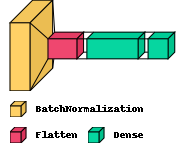

In [8]:
fcn_model = create_fcn(k)
if Visual_Keras:
    visualkeras.layered_view(fcn_model, legend=True)
else:
    plot_model(fcn_model, show_shapes=True, show_layer_names=True)

#### Training the models:

In [9]:
from tensorflow.keras.losses import SparseCategoricalCrossentropy
from tensorflow.keras.optimizers import SGD
criterion = SparseCategoricalCrossentropy()
batch_X, batch_y = tf.constant(data, dtype=tf.float32), tf.constant(y, dtype=tf.int32)
small_cnn_model.summary()
LR = 0.01
opt = SGD(learning_rate=LR)

Model: "sequential"
_________________________________________________________________
 Layer (type)                Output Shape              Param #   
 batch_normalization (BatchN  (None, 17, 17, 1)        4         
 ormalization)                                                   
                                                                 
 conv2d (Conv2D)             (None, 1, 1, 512)         148480    
                                                                 
 activation (Activation)     (None, 1, 1, 512)         0         
                                                                 
 global_average_pooling2d (G  (None, 512)              0         
 lobalAveragePooling2D)                                          
                                                                 
 dense (Dense)               (None, 2)                 1026      
                                                                 
Total params: 149,510
Trainable params: 149,508
Non-trai

In [10]:
import importlib
from functions.dots_models import *
#importlib.reload(dots_models)
InteractiveShell.ast_node_interactivity = "last_expr"

In [11]:
train_dot_model(small_cnn_model, batch_X,batch_y,criterion,opt,LR)

Epoch: 100, Train Acc: 100.000, Loss: 0.006
Epoch: 200, Train Acc: 100.000, Loss: 0.003
Epoch: 300, Train Acc: 100.000, Loss: 0.002
Epoch: 400, Train Acc: 100.000, Loss: 0.001
Epoch: 500, Train Acc: 100.000, Loss: 0.001
Epoch: 600, Train Acc: 100.000, Loss: 0.001
Epoch: 700, Train Acc: 100.000, Loss: 0.001
Epoch: 800, Train Acc: 100.000, Loss: 0.001
Epoch: 900, Train Acc: 100.000, Loss: 0.001
Epoch: 1000, Train Acc: 100.000, Loss: 0.001
Epoch: 1100, Train Acc: 100.000, Loss: 0.001
Epoch: 1200, Train Acc: 100.000, Loss: 0.001
Epoch: 1300, Train Acc: 100.000, Loss: 0.001
Epoch: 1400, Train Acc: 100.000, Loss: 0.001
Epoch: 1500, Train Acc: 100.000, Loss: 0.000
Epoch: 1600, Train Acc: 100.000, Loss: 0.000
Epoch: 1700, Train Acc: 100.000, Loss: 0.000
Epoch: 1800, Train Acc: 100.000, Loss: 0.000
Epoch: 1900, Train Acc: 100.000, Loss: 0.000
Epoch: 2000, Train Acc: 100.000, Loss: 0.000


In [12]:
small_cnn_model_padding.summary()
LR = 0.01
opt = SGD(learning_rate=LR)
train_dot_model(small_cnn_model_padding, batch_X,batch_y,criterion,opt,LR)

Model: "sequential_1"
_________________________________________________________________
 Layer (type)                Output Shape              Param #   
 batch_normalization_1 (Batc  (None, 17, 17, 1)        4         
 hNormalization)                                                 
                                                                 
 lambda (Lambda)             (None, 33, 33, 1)         0         
                                                                 
 conv2d_1 (Conv2D)           (None, 17, 17, 512)       148480    
                                                                 
 activation_1 (Activation)   (None, 17, 17, 512)       0         
                                                                 
 global_average_pooling2d_1   (None, 512)              0         
 (GlobalAveragePooling2D)                                        
                                                                 
 dense_1 (Dense)             (None, 2)                

In [13]:
fcn_model.summary()
LR = 0.01
opt = SGD(learning_rate=LR)
train_dot_model(fcn_model, batch_X,batch_y,criterion,opt,LR)

Model: "sequential_2"
_________________________________________________________________
 Layer (type)                Output Shape              Param #   
 batch_normalization_2 (Batc  (None, 17, 17, 1)        4         
 hNormalization)                                                 
                                                                 
 flatten (Flatten)           (None, 289)               0         
                                                                 
 dense_2 (Dense)             (None, 512)               148480    
                                                                 
 dense_3 (Dense)             (None, 2)                 1026      
                                                                 
Total params: 149,510
Trainable params: 149,508
Non-trainable params: 2
_________________________________________________________________
Epoch: 100, Train Acc: 100.000, Loss: 0.004
Epoch: 200, Train Acc: 100.000, Loss: 0.002
Epoch: 300, Train Acc: 100

We get the same result as the paper code. Similar values of the loss (which was observed in their notebook Two_Class_White_Black.ipynb). <u> We also observe that the cnn without padding has a similar training loss to the fcn</u>

#### Generating Adversarial data

Now let's generate adversarial data on the three models:

### PGD

For each of the three models, we perform adversarial attacks using the PGD algorithm for different epsilon values. We generate adversarial examples, then calculate the distance between the original and adversarial examples (the distance is not used here), and evaluate the accuracy of the models on the adversarial examples.

In [22]:
from art.attacks.evasion import ProjectedGradientDescent
from art.estimators.classification import TensorFlowV2Classifier
# Define the loss object for each classifier
small_cnn_padding_loss_object = tf.keras.losses.SparseCategoricalCrossentropy()
fcn_loss_object = tf.keras.losses.SparseCategoricalCrossentropy()
small_cnn_loss_object = tf.keras.losses.SparseCategoricalCrossentropy()
distances_small_cnn_model = []
distances_small_cnn_model_padding = []
distances_fcn_model = []
accuracies_small_cnn_model = []
accuracies_small_cnn_model_padding = []
accuracies_fcn_model = []
small_cnn_model.compile(optimizer='adam', loss=small_cnn_loss_object, metrics=['accuracy'])
classifier = TensorFlowV2Classifier(
    model=small_cnn_model,
    loss_object=small_cnn_loss_object,
    input_shape=(17, 17, 1),
    nb_classes=2, #10
    clip_values=(0, 1),
)
eps_values = [0.001, 0.002, 0.005, 0.01, 0.05, 0.1, 0.3, 0.5]

for eps in eps_values:
    adversary = ProjectedGradientDescent(estimator=classifier, eps=eps, max_iter=100,verbose=False)
    small_cnn_adv_x = adversary.generate(x=batch_X.numpy(), y=batch_y.numpy())
    distance_small_cnn_model = np.linalg.norm(batch_X - small_cnn_adv_x)
    distances_small_cnn_model.append(distance_small_cnn_model)
    accuracy = small_cnn_model.evaluate(small_cnn_adv_x, batch_y,verbose=0)
    accuracy_value = accuracy[1] * 100
    accuracies_small_cnn_model.append(accuracy_value)
    print("Epsilon: {}, Robust Accuracy: {}".format(eps, accuracy_value))

Epsilon: 0.001, Robust Accuracy: 100.0
Epsilon: 0.002, Robust Accuracy: 100.0
Epsilon: 0.005, Robust Accuracy: 100.0
Epsilon: 0.01, Robust Accuracy: 100.0
Epsilon: 0.05, Robust Accuracy: 100.0
Epsilon: 0.1, Robust Accuracy: 100.0
Epsilon: 0.3, Robust Accuracy: 0.0
Epsilon: 0.5, Robust Accuracy: 0.0


In [23]:
fcn_model.compile(optimizer='adam', loss=fcn_loss_object, metrics=['accuracy'])
classifier = TensorFlowV2Classifier(
    model=fcn_model,
    loss_object=fcn_loss_object,
    input_shape=(17, 17, 1),
    nb_classes=10,
    clip_values=(0, 1),
)
eps_values = [0.001, 0.002, 0.005, 0.01, 0.05, 0.1, 0.3, 0.5]
for eps in eps_values:
    adversary = ProjectedGradientDescent(estimator=classifier, eps=eps, max_iter=100,verbose=False)
    fcn_model_adv_x = adversary.generate(x=batch_X.numpy(), y=batch_y.numpy())
    distance_fcn_model = np.linalg.norm(batch_X - fcn_model_adv_x)
    distances_fcn_model.append(distance_fcn_model)
    accuracy = fcn_model.evaluate(fcn_model_adv_x, batch_y,verbose=0)
    accuracy_value = accuracy[1] * 100
    accuracies_fcn_model.append(accuracy_value)
    print("Epsilon: {}, Robust Accuracy: {}".format(eps, accuracy_value))

Epsilon: 0.001, Robust Accuracy: 100.0
Epsilon: 0.002, Robust Accuracy: 100.0
Epsilon: 0.005, Robust Accuracy: 100.0
Epsilon: 0.01, Robust Accuracy: 100.0
Epsilon: 0.05, Robust Accuracy: 0.0
Epsilon: 0.1, Robust Accuracy: 0.0
Epsilon: 0.3, Robust Accuracy: 0.0
Epsilon: 0.5, Robust Accuracy: 0.0


In [24]:
small_cnn_model_padding.compile(optimizer='adam', loss=small_cnn_padding_loss_object, metrics=['accuracy'])
classifier = TensorFlowV2Classifier(
    model=small_cnn_model_padding,
    loss_object=small_cnn_padding_loss_object,
    input_shape=(17, 17, 1),
    nb_classes=10,
    clip_values=(0, 1),
)
eps_values = [0.001, 0.002, 0.005, 0.01, 0.05, 0.1, 0.3, 0.5]
for eps in eps_values:
    adversary = ProjectedGradientDescent(estimator=classifier, eps=eps, max_iter=100,verbose=False)
    small_cnn_model_padding_adv_x = adversary.generate(x=batch_X.numpy(), y=batch_y.numpy())
    distance_small_cnn_model_padding = np.linalg.norm(batch_X - small_cnn_model_padding_adv_x)
    distances_small_cnn_model_padding.append(distance_small_cnn_model_padding)
    accuracy = small_cnn_model_padding.evaluate(small_cnn_model_padding_adv_x, batch_y,verbose=0)
    accuracy_value = accuracy[1] * 100
    accuracies_small_cnn_model_padding.append(accuracy_value)
    print("Epsilon: {}, Robust Accuracy: {}".format(eps, accuracy_value))

Epsilon: 0.001, Robust Accuracy: 100.0
Epsilon: 0.002, Robust Accuracy: 100.0
Epsilon: 0.005, Robust Accuracy: 0.0
Epsilon: 0.01, Robust Accuracy: 0.0
Epsilon: 0.05, Robust Accuracy: 0.0
Epsilon: 0.1, Robust Accuracy: 0.0
Epsilon: 0.3, Robust Accuracy: 0.0
Epsilon: 0.5, Robust Accuracy: 0.0


We can see that the fcn model is more robust compared to the cnn (it needs a bigger epsilon value to affect its robustness). And this is the same as observed by the results from the paper's experiment which are below:
For the CNN:

| Epsilon | Robust Accuracy |
|---------|-----------------|
| 0.001   | 100             |
| 0.002   | 100             |
| 0.005   | 0               |
| 0.01    | 0               |
| 0.05    | 0               |
| 0.1     | 0               |
| 0.3     | 0               |
| 0.5     | 0               |

For the FCN:


| Epsilon | Robust Accuracy |
|---------|-----------------|
| 0.001   | 100             |
| 0.002   | 100             |
| 0.005   | 100             |
| 0.01    | 100             |
| 0.05    | 0               |
| 0.1     | 0               |
| 0.3     | 0               |
| 0.5     | 0               |

<u>We also observe that the CNN without padding's robustness is similar to the FCN robustness.</u>
To visualize this, we plot:

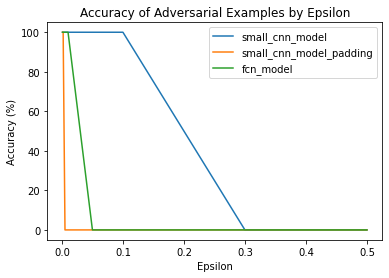

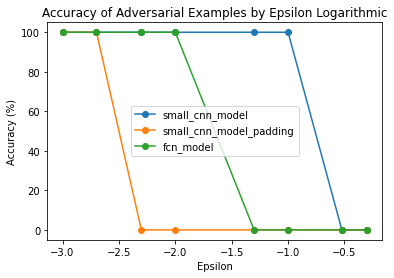

In [25]:
# Plot the accuracies for each model
plt.plot(eps_values, accuracies_small_cnn_model, label="small_cnn_model")
plt.plot(eps_values, accuracies_small_cnn_model_padding, label="small_cnn_model_padding")
plt.plot(eps_values, accuracies_fcn_model, label="fcn_model")
plt.xlabel("Epsilon")
plt.ylabel("Accuracy (%)")
plt.title("Accuracy of Adversarial Examples by Epsilon")
plt.legend()
plt.show()

plt.plot(np.log10(eps_values), accuracies_small_cnn_model, marker='o', label="small_cnn_model")
plt.plot(np.log10(eps_values), accuracies_small_cnn_model_padding, marker='o', label="small_cnn_model_padding")
plt.plot(np.log10(eps_values), accuracies_fcn_model, marker='o', label="fcn_model")
plt.xlabel("Epsilon")
plt.ylabel("Accuracy (%)")
plt.title("Accuracy of Adversarial Examples by Epsilon Logarithmic")
plt.legend()
plt.show()

### Shift Invariance

<u> Here we verify the shift invariance of the models, this test is not in the paper's experiments explicitly but it's a claim that we want to verify, we simply shift the original images then evaluate the accuracy of the models to the shifts.</u>

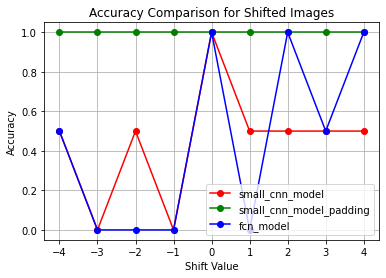

In [31]:
shift_range = 4
num_shifts = 9
shift_values = np.linspace(-shift_range, shift_range, num_shifts)

models = [small_cnn_model, small_cnn_model_padding, fcn_model]
model_names = ['small_cnn_model', 'small_cnn_model_padding', 'fcn_model']
colors = ['red', 'green', 'blue']

for model, model_name, color in zip(models, model_names, colors):
    accuracies = []
    for shift in shift_values:
        shifted = np.roll(batch_X, int(shift), axis=1)
        accuracy = model.evaluate(shifted, batch_y, verbose=0)[1]
        accuracies.append(accuracy)

    plt.plot(shift_values, accuracies, marker='o', color=color, label=model_name)


plt.xlabel('Shift Value')
plt.ylabel('Accuracy')
plt.title('Accuracy Comparison for Shifted Images')
plt.grid(True)
plt.legend()
plt.show()


<u> We can see that the CNN is the only one who is shift invariant and that the CNN without padding behaves like the FCN (just like we saw with both the training and the PGD attack). So here the padding is exactly what gives the CNN its shift invariance and we observed that the shift invariant CNN is less robust to the pgd attack, we will confirm that with other types of attack. </u>

And here are the adversarial images:

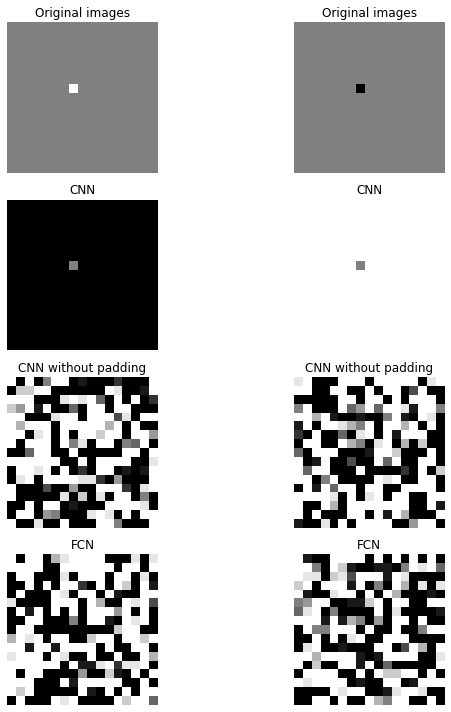

In [123]:
titles = ['Original images', 'CNN', 'CNN without padding', 'FCN']
arrays = [np.squeeze(batch_X), np.squeeze(small_cnn_model_padding_adv_x), np.squeeze(small_cnn_adv_x), np.squeeze(fcn_model_adv_x)]

fig, axs = plt.subplots(4, 2, figsize=(10, 10))
for i, array in enumerate(arrays):
    for j in range(2):
        axs[i, j].imshow(array[j], cmap='gray', vmin=0, vmax=1)
        axs[i, j].set_title(titles[i])
        axs[i, j].axis('off')
plt.tight_layout()
plt.show()


In [78]:
 # this visual effect doesnt show in distances
 # np.linalg.norm(np.squeeze(batch_X) -  np.squeeze(small_cnn_adv_x))

### Ploting Distances

Now, to generate the plot for the distances, the PGD is not used because it is a bounded-norm attack. And to see the effect of the attack on the distance between the original images and the attack images we need a bounded-norm attack. The paper's experiment used the DDN attack: [Decoupling direction and norm](https://arxiv.org/abs/1811.09600).
Since the DDN is not available in the tensorflow framework, we did the test using the same DNN used by the paper using pytorch, the models are recreated and retrained in pytorch. It's produced using: **scripts/DNN_plot.py**. And here is the result:


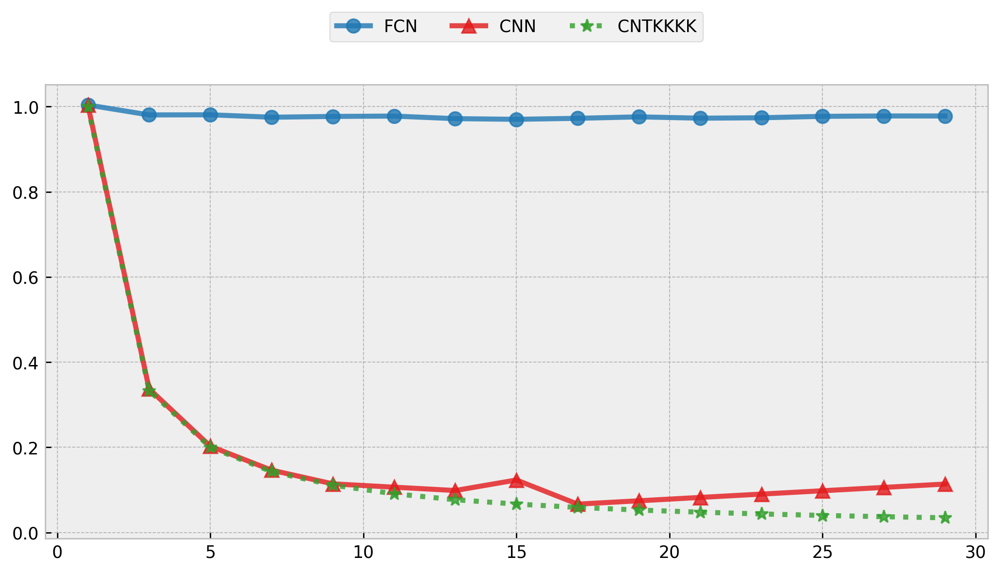

In [3]:
from IPython.display import Image
PATH = "plots/"
Image(filename = PATH + "black_white_dot.png", width=12, height=8)

Which is similar to the plot of the paper:

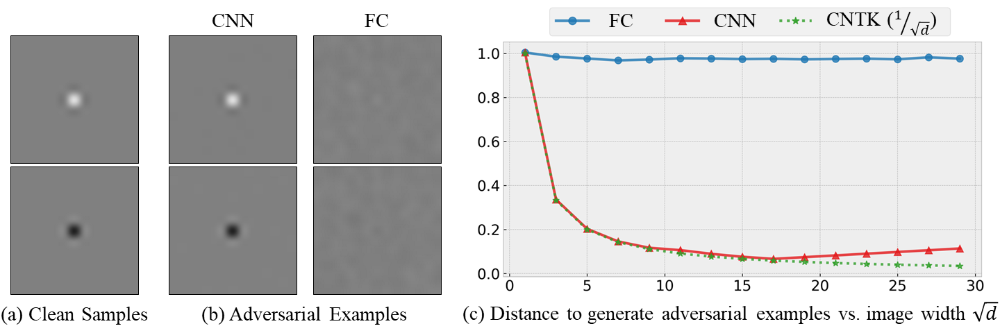

In [4]:
Image(filename = PATH + "teaser.png", width=12, height=8)

##### <u> Deep Fool</u>

<u> As we mentionned before, formally we can categorize the attacks into two categories; the first one is bounded-norm
attacks, and the second one is minimum-norm attacks. DeepFool, C&W, FMN, FAB, DDN, and ALMA are minimumnorm attacks, and FGSM, PGD, and momentum extension
of PGD are bounded-norm attacks.</u> [Revisiting DeepFool: generalization and improvement](https://arxiv.org/abs/2303.12481)
This part is also not in the paper but it's to understand more the difference between the the FCN and CNN when it comes to the perturbation distance ie how much perturbation is needed to get the adversarial image. So we will be using Deep Fool which is a minimum-norm attack, and we expect the behavior to be somehow similar to the results from the DNN. We are also adding the CNN without padding to the comparaison.


In [5]:
from art.attacks.evasion import DeepFool
from art.estimators.classification import TensorFlowV2Classifier
distances_dict = dict()
for model in ['FC', 'Conv_no_padding', 'Conv_padding']:
    distances_adv = []
    print(model)
    for i in tqdm(range(4,15)):
        k = i * 2 + 1
        input_shape = (k, k)
        batch = create_dataset_dots(k)
        #batch_X, batch_y = tf.constant(np.expand_dims(batch[0], -1), dtype=tf.float32), tf.constant(batch[1], dtype=tf.int32)
        batch_X, batch_y = np.expand_dims(batch[0], -1), batch[1]
        n_hidden = 100
        kernel_size = k
        criterion = SparseCategoricalCrossentropy()
        LR = 0.01
        opt = SGD(learning_rate=LR)
        net = create_fcn(k, n_hidden)
        if model== 'FC':
            net=create_fcn(k)
        elif model=='Conv_no_padding':
            net=create_small_cnn_np(k)
        elif model=='Conv_padding':
            net=create_small_cnn(k)
        train_dot_model_no_verbose(net, batch_X, batch_y, criterion,opt,LR)
        #batch_X = tf.Variable(batch_X)
        classifier = TensorFlowV2Classifier(
            model=net,
            loss_object=criterion,
            input_shape=(input_shape[0],input_shape[1],1),
            nb_classes=2,
            clip_values=(0, 1),
        )
        adv_crafter = DeepFool(classifier,batch_size=2, verbose=False)
        x_adv = adv_crafter.generate(x=batch_X, y=batch_y)
        #small_cnn_adv_x = adversary.generate(x=batch_X.numpy(), y=batch_y.numpy())
        distance_ = np.linalg.norm(batch_X - x_adv)
        distances_adv.append(distance_)
    distances_dict[model] = distances_adv

FC


  0%|          | 0/11 [00:00<?, ?it/s]

100%|██████████| 11/11 [10:00<00:00, 54.57s/it]


Conv_no_padding


100%|██████████| 11/11 [07:47<00:00, 42.48s/it]


Conv_padding


100%|██████████| 11/11 [09:37<00:00, 52.47s/it]


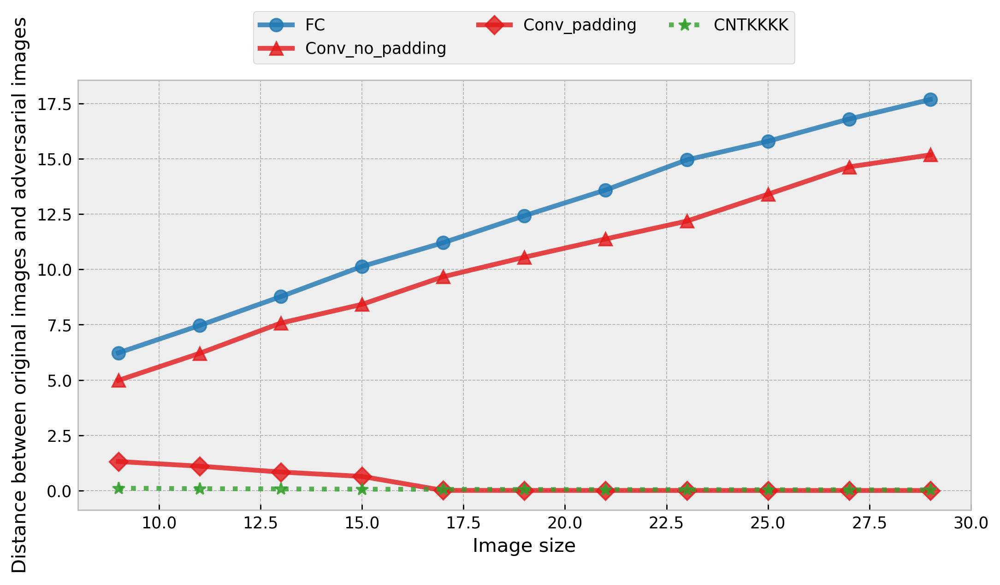

In [8]:
CAND_COLORS = ['#a6cee3', '#1f78b4', '#b2df8a', '#33a02c', '#fb9a99', '#e31a1c', '#fdbf6f', '#ff7f00', '#cab2d6', '#6a3d9a', '#90ee90', '#9B870C', '#2f4554', '#61a0a8', '#d48265', '#c23531']
colors1 = CAND_COLORS[::2]
colors2 = CAND_COLORS[1::2]


with plt.style.context('bmh'):
    fig = plt.figure(dpi=250, figsize=(10, 5.5))
    plt.clf()
    ks = [i * 2 + 1 for i in range(4,15)]
    ax = plt.subplot(111)

    plt.plot(ks, distances_dict['FC'], marker='o', linewidth=3, markersize=8, label='FC', color=colors2[0], alpha=0.8)
    plt.plot(ks, distances_dict['Conv_no_padding'], marker='^', linewidth=3, markersize=8, label='Conv_no_padding', color=colors2[2], alpha=0.8)
    plt.plot(ks, distances_dict['Conv_padding'], marker="D", linewidth=3, markersize=8, label='Conv_padding', color=colors2[2], alpha=0.8)
    plt.plot(ks, [1.0/(i*2+1) for i in range(4,15)], linestyle='dotted', marker='*', linewidth=3, markersize=8, label='CNTKKKK', color=colors2[1], alpha=0.8)
    plt.xlabel("Image size")
    plt.ylabel("Distance between original images and adversarial images")
    box = ax.get_position()
    ax.set_position([box.x0, box.y0 + box.height * 0.1, box.width, box.height * 0.9])
    plt.legend(loc='upper center', bbox_to_anchor=(0.5, 1.178), ncol=3)
    plt.savefig('FC_CNN_CNNnp_distances.png')


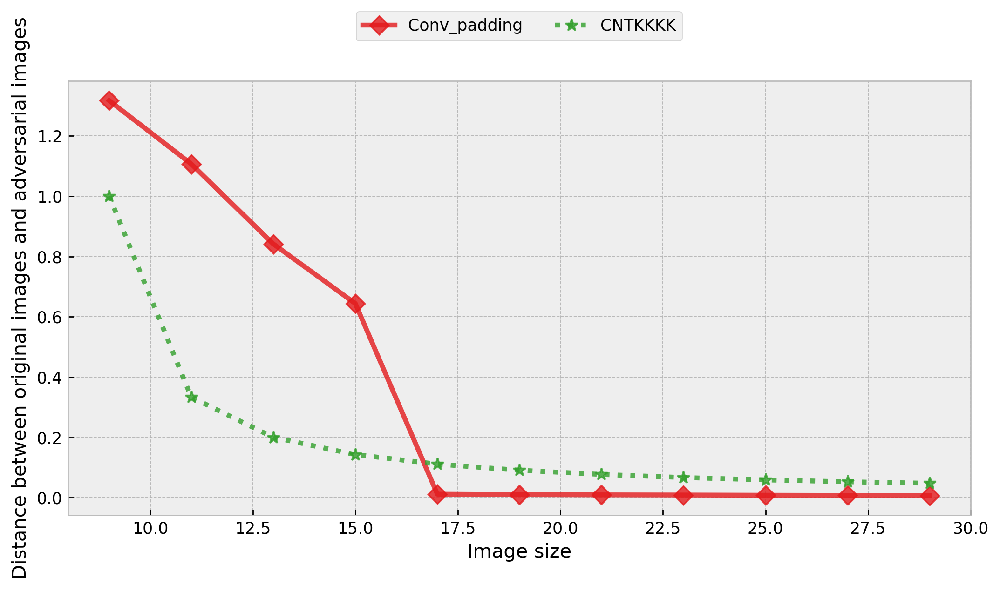

In [10]:
CAND_COLORS = ['#a6cee3', '#1f78b4', '#b2df8a', '#33a02c', '#fb9a99', '#e31a1c', '#fdbf6f', '#ff7f00', '#cab2d6', '#6a3d9a', '#90ee90', '#9B870C', '#2f4554', '#61a0a8', '#d48265', '#c23531']
colors1 = CAND_COLORS[::2]
colors2 = CAND_COLORS[1::2]


with plt.style.context('bmh'):
    fig = plt.figure(dpi=250, figsize=(10, 5.5))
    plt.clf()
    ks = [i * 2 + 1 for i in range(4,15)]
    ax = plt.subplot(111)
    plt.plot(ks, distances_dict['Conv_padding'], marker="D", linewidth=3, markersize=8, label='Conv_padding', color=colors2[2], alpha=0.8)
    plt.plot(ks, [1.0/(i*2+1) for i in range(0,11)], linestyle='dotted', marker='*', linewidth=3, markersize=8, label='CNTKKKK', color=colors2[1], alpha=0.8)
    plt.xlabel("Image size")
    plt.ylabel("Distance between original images and adversarial images")
    box = ax.get_position()
    ax.set_position([box.x0, box.y0 + box.height * 0.1, box.width, box.height * 0.9])
    plt.legend(loc='upper center', bbox_to_anchor=(0.5, 1.178), ncol=3)
    plt.savefig('CNN_distances.png')

<u> The behavior is not entirely the same. But can lead to the same conclusion, the FCN needs a much bigger perturbation (in this case increasing with the image size) while the CNN needs a much smaller perturbation, which is even decreasing, it doesnt follow the theoritical plot as for the DDN. And again,the FCN and the CNN without padding again have a similar behavior </u>

### <h3 style="background-color:#56cbf9;color:white;text-align: center;padding-top: 5px;padding-bottom: 5px;border-radius: 15px 50px;"><strong><centre>Adversarial Robustness  on MNIST</centre></strong></h3>

Here we use MNIST (LeCun et al., 2010). To train the models, and produce the attack data. For script for this is in: /scripts/full_mnist_gpu_2.py
Briefly here is what the script does:
  1. Sets up GPU devices if available.
  2. Loads the MNIST dataset using the load_mnist function from ART.
  3. Defines the model architectures and create ART classifiers based on it.
  4. Defines a train_step function that performs a single training step. We are using a custom training as described in the paper. So all the models were trained for 20 epochs using the ADAM optimizer, with a batch size of 200 and learning rate of 0.01. The learning rate is decreased by a factor of 10 at the $10^{th}$ and $15^{th}$ epoch.
  5. Saves the trained models and related information to files using pickle.
6. Creates adversarial data by applying ART attacks (Fast Gradient Method and Projected Gradient Descent) for different epsilons. And Save it. For the FGM we generated attacks on all the data ```attack.generate(x=x_train)``` while for the PGD we used ```attack.generate(x=x_train[:10000])``` and ```attack.generate(x=x_test[:5000])```.

We used [LRZ AI Systems](https://doku.lrz.de/lrz-ai-systems-11484278.html) to run the scripts. More details about this will be in the repository.


In [5]:
from tensorflow.keras.models import Sequential
from tensorflow.keras.layers import Conv2D, ReLU, GlobalAveragePooling2D, Dense, Lambda, GlobalMaxPooling2D, Flatten
from art.estimators.classification import TensorFlowV2Classifier
from art.attacks.evasion import FastGradientMethod, ProjectedGradientDescentTensorFlowV2
import os
from tensorflow.keras import layers
import pickle
from art.utils import load_mnist

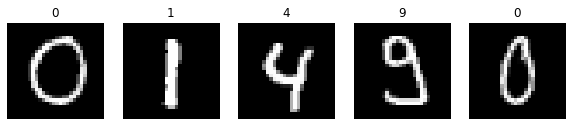

In [6]:
(x_train, y_train), (x_test, y_test), min_pixel_value, max_pixel_value = load_mnist()
class_names = ['0', '1', '2', '3', '4', '5', '6', '7', '8', '9']
num_images = 5
random_indexes = np.random.choice(len(x_test), num_images, replace=False)
images = x_test[random_indexes]
labels = y_test[random_indexes]
plt.figure(figsize=(10, 5))
for i in range(num_images):
    plt.subplot(1, num_images, i+1)
    plt.imshow(images[i].reshape(28, 28), cmap='gray')
    plt.title(class_names[np.argmax(labels[i])])
    plt.axis('off')
plt.show()

Here is a brief description of the models:
- Simple_FC:
    - A simple FCN that consists of a single hidden layer.
    - The input images are flattened into a vector and passed through the hidden layer with ReLU activation.
- Simple_Conv:
    - A convolutional neural network (CNN) with circular padding.
    - It performs circular padding on the input images to handle border effects during convolution.
    - The model includes a convolutional layer followed by a ReLU activation then by Global average pooling.
<u> The next three models are added:</u>
- Simple_Conv_NL:
    - This model is similar to Simple_Conv but does not use circular padding, NL: for no lambda layer.
    - It directly applies convolution on the input images without additional padding.
    - Then ReLU and Global average pooling.
- Simple_Conv_max:
    - This model is also a CNN architecture with max pooling instead of global average pooling.
- simple_Conv_2:
    - This model is also a CNN architecture but with 2 layers and using max pooling.
The output layer for all models consists of 10 units, corresponding to the 10 classes in the MNIST dataset.

The models that are used in the paper are Simple_FC and Simple_Conv, with different hyperparameters [simple_FC_256, simple_Conv_10_512, simple_FC_1024,simple_Conv_12_2048]. <u> While the other models are added for comparison (to get more understanding), note that the max pooling was used by the paper's authors during tests (in their repo) but it is not used in the paper.</u>

In [7]:

def circular_padding(x, padding_size):
    # Perform circular padding on the input tensor
    return tf.pad(x, [[0, 0], [padding_size, padding_size], [padding_size, padding_size], [0, 0]], mode='SYMMETRIC')

def simple_Conv(n_hidden, kernel_size=10, padding_size=-1):
    if padding_size == -1:
        padding_size = kernel_size // 2

    model = Sequential()
    model.add(Lambda(lambda x: circular_padding(x, padding_size), input_shape=(28, 28, 1)))
    model.add(Conv2D(n_hidden, kernel_size=kernel_size, padding='same'))
    model.add(ReLU())
    model.add(GlobalAveragePooling2D())
    model.add(Dense(10))

    return model

def simple_FC(n_hidden):
    model = Sequential()
    model.add(Flatten(input_shape=(28, 28)))
    model.add(Dense(n_hidden, activation="relu"))
    model.add(Dense(10))

    return model

def simple_Conv_NL(n_hidden,kernel_size=10):
    """ no lambda """
    model = Sequential()
    model.add(Conv2D(n_hidden, kernel_size=kernel_size, padding='valid', input_shape=(28, 28, 1), activation='relu'))
    model.add(GlobalAveragePooling2D())
    model.add(Dense(10))

    return model

def simple_Conv_max(n_hidden, kernel_size=10,padding_size=0):
    model = Sequential()
    model.add(Lambda(lambda x: circular_padding(x, padding_size), input_shape=(28, 28, 1)))
    model.add(Conv2D(n_hidden, kernel_size=kernel_size, padding='same', activation='relu'))
    model.add(GlobalMaxPooling2D())
    model.add(Dense(10))

    return model

def simple_Conv_2():
    model = Sequential()
    model.add(Conv2D(32, (3, 3), activation='relu', input_shape=(28, 28, 1)))
    model.add(MaxPooling2D((2, 2)))
    model.add(Conv2D(64, (3, 3), activation='relu'))
    model.add(MaxPooling2D((2, 2)))
    model.add(Flatten())
    model.add(Dense(128, activation='relu'))
    model.add(Dense(10))

    return model

In [8]:
LRZ = False
if LRZ:
    base_path = "/dss/dsshome1/lxc0C/apdl010/Analysis-of-new-phenomena-in-deep-learning/Reproduction"
else:
    base_path =  "models/mnist_main"
# Load models
simple_FC_256 = tf.keras.models.load_model(base_path + '/mnist_model_0.h5', compile=False)
simple_Conv_10_512 = tf.keras.models.load_model(base_path+'/mnist_model_1.h5', compile=False )
simple_Conv_NL = tf.keras.models.load_model(base_path+'/mnist_model_2.h5', compile=False )
simple_Conv_max   = tf.keras.models.load_model(base_path+'/mnist_model_3.h5', compile=False )
simple_FC_1024 = tf.keras.models.load_model(base_path+'/mnist_model_4.h5', compile=False )
simple_Conv_12_2048 = tf.keras.models.load_model(base_path+'/mnist_model_5.h5', compile=False )
simple_Conv_2 = tf.keras.models.load_model(base_path+'/mnist_model_6.h5', compile=False ) # there was a typo here mnist_model_5

model_names = {'simple_FC_256':simple_FC, 'simple_Conv_10_512':simple_Conv, 'simple_Conv_NL':simple_Conv_NL, 'simple_Conv_max':simple_Conv_max,
               'simple_FC_1024':simple_FC, 'simple_Conv_12_2048':simple_Conv,'simple_Conv_2':simple_Conv_2}
models = [simple_FC_256, simple_Conv_10_512, simple_Conv_NL, simple_Conv_max, simple_FC_1024,simple_Conv_12_2048,simple_Conv_2]
models = [[models[i]] for i in range(len(models))]

All models were trained for 20 epochs using the ADAM optimizer, with a batch size of 200 and learning rate of 0.01. The learning rate is decreased by a factor of 10 at the 10th and 15th epoch. To evaluate the robustness of these models. We use PGD l2 and l∞ attacks with different epsilon values, a single random restart, 10 iterations and step-size of epsilon/5. Just like it is stated by the paper.

In [9]:
base_path =  "data/adversarial_data_2"

# Load the attack data
attack_data = {}
attack_params =  [[np.inf, [0.05, 0.1,  0.15, 0.2, 0.25, 0.3]],[2, [0.5, 1, 1.5,  2.5, 3]]]
attack_name = "ProjectedGradientDescentTensorFlowV2"
for model_name, model in zip(model_names,models):
    for norm, epsilons in attack_params:
        for epsilon in epsilons:
            for data_type in ["train", "test"]:
                file_name = base_path + f"/2_{model_name}_{attack_name}_{epsilon}_{data_type}.npz"
                try:
                    attack_data[(model_name, norm, epsilon,data_type)] = (model,np.load(file_name))
                except FileNotFoundError:
                    print(file_name + " data not found ")

We evaluate the accuracy on test data, to do it for training data use: ```data_type == "train"```, the results should be similar.

In [10]:
norms = [attack_params[0][0], attack_params[1][0]]
epsilons = {
    attack_params[0][0]: attack_params[0][1],
    attack_params[1][0]: attack_params[1][1]
}
# Getting accuracies on normal data (epsilon = 0 as a notation)
accuracy_data = {norm: {model: [] for model in list(model_names.keys())} for norm in norms}
for (model_name, norm, epsilon, data_type), (model, data) in tqdm(attack_data.items()):
    if data_type == "test":
        model = model[0]
        predictions = model.predict(x_test,verbose=0)
        accuracy = np.sum(np.argmax(predictions, axis=1) == np.argmax(y_test, axis=1)) / len(y_test)
        accuracy_data[norm][model_name].append((0, accuracy))
    else:
        continue
# Getting accuracies on adversarial data (epsilon > 0)
for (model_name, norm, epsilon, data_type), (model, data) in tqdm(attack_data.items()):
    if data_type == "test":
        model = model[0]
        predictions = model.predict(data[f'x_{data_type}_attack'],verbose=0)
        accuracy = np.sum(np.argmax(predictions, axis=1) == np.argmax(data[f'y_{data_type}_attack'], axis=1)) / len(data[f'y_{data_type}_attack'])
        accuracy_data[norm][model_name].append((epsilon, accuracy))
    else:
        continue

100%|██████████| 154/154 [02:48<00:00,  1.09s/it]


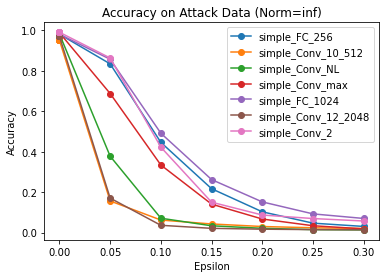

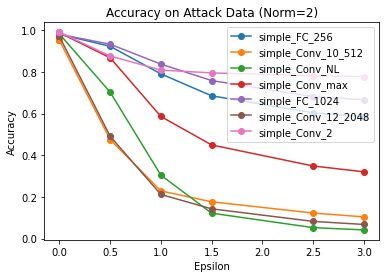

In [11]:
for norm in norms:
    plt.figure()
    for model_name in model_names:
        accuracies = accuracy_data[norm][model_name]
        eps, accs = zip(*accuracies)
        plt.plot(eps, accs, marker='o', label=model_name)
    plt.xlabel('Epsilon')
    plt.ylabel('Accuracy')
    plt.title(f"Accuracy on Attack Data (Norm={norm})")
    plt.legend()
    plt.show()

In [12]:
import plotly.graph_objects as go
for norm in norms:
    fig = go.Figure()
    for model_name in model_names:
        accuracies = accuracy_data[norm][model_name]
        eps, accs = zip(*accuracies)
        # Set the line style based on the model name
        line_dash = 'solid' if 'FC' not in model_name else 'dash'
        fig.add_trace(go.Scatter(x=eps, y=accs, mode='lines+markers', name=model_name, line=dict(dash=line_dash)))
    fig.update_layout(
        xaxis_title='Epsilon',
        yaxis_title='Accuracy',
        title=f'Accuracy on Attack Data (Norm={norm})',
        showlegend=True
    )
    fig.show()

For the reproduction part we get exactly as expected, if we select the models [simple_FC_256, simple_Conv_10_512, simple_FC_1024,simple_Conv_12_2048] in the interactive html plot, the plot we get is similar to the one produced by the paper. We observe that although the clean accuracy for the models is similar on the dataset, FC networks are more robust than Shift Invariant CNNs, especially for large epsilon values, for both norms.

<u> For the additional models, it seems that max pooling makes the models more robust but it is still less robust than the FCN. And the CNN with no padding is a little more robust for smaller epsilon values, while the CNN with multiple layers has an unexpected behavior, it seems more robust maybe 10 iterations are not enough. We will see that it has a similar behavior for the other dataset, and we need to explore this in the extention part</u>

##### Shift Invariance

<u> Let's evaluate shift invariance using the shifting method.</u>

100%|██████████| 21/21 [06:03<00:00, 17.33s/it]


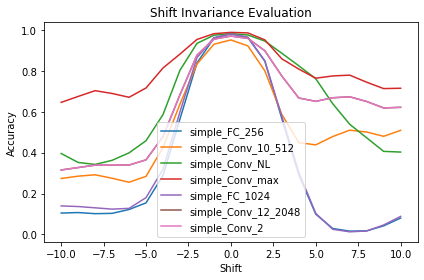

In [6]:
def shift_images(images, shift, axis=0):
    shifted_images = np.roll(images, shift, axis=axis)
    return shifted_images

def evaluate_shift_invariance(model, x_test, y_test, shifts, axis=0):
    accuracies = []
    for shift in tqdm(shifts):
        shifted_images = shift_images(x_test, shift, axis=axis)
        predictions = model.predict(shifted_images,verbose=0)
        accuracy = np.sum(np.argmax(predictions, axis=1) == np.argmax(y_test, axis=1)) / len(y_test)
        accuracies.append(accuracy)
    return accuracies

shifts = range(10, -11, -1)
results = []
for model, model_name in zip(models, model_names):
    model = model[0]
    accuracy_axis1 = evaluate_shift_invariance(model, x_test, y_test, shifts, axis=1)
    results.append((model_name, accuracy_axis1))
for model_name, accuracy_axis1 in results:
    plt.plot(shifts, accuracy_axis1, label=model_name)
plt.xlabel('Shift')
plt.ylabel('Accuracy')
plt.legend()
plt.title('Shift Invariance Evaluation')
plt.tight_layout()
plt.show()

In [9]:
fig = go.Figure()
for model_name, accuracy_axis1 in results:
    shifts_abs = []
    results_abs_k = []
    for k in range(len(shifts) // 2 + 1):
        shifts_abs.append(shifts[k])
        results_abs_k.append((accuracy_axis1[k] + accuracy_axis1[-k - 1]) / 2)
        line_dash = 'solid' if 'FC' not in model_name else 'dash'
    fig.add_trace(go.Scatter(x=shifts_abs, y=results_abs_k, mode='lines', name=model_name, line=dict(dash=line_dash)))
fig.update_layout(
    xaxis=dict(title='Shift'),
    yaxis=dict(title='Accuracy'),
    title='Shift Invariance Evaluation',
    showlegend=True
)
fig.show()

We can see that the FC models are not shift invariant compared to the CNNS, but for the CNNs the shift invariance isn't necessarily related to the robustness (using this shift method).

In the paper, shift invariance is evaluated using shift consistency scores. The consistency score calculates the percentage of the time that the model
preserves its predicted labels when a random shift is applied to the image [Making Convolutional Networks Shift-Invariant Again
.](https://arxiv.org/abs/1904.11486) The algorithm to compute it is evaluate_shift_consistency and can be found in utils.py .
<u> Note that shift consistency does not measure the accuracy of the model if the data is shifted (which is what the shifting method computes) but it evaluates the consistency of the model to shifting.</u>


In [ ]:
from tabulate import tabulate
from functions.utils import evaluate_shift_consistency
# getting consistency scores
model_consistency_dict = evaluate_shift_consistency(models,list(model_names.keys()), x_test)


In [11]:
# Print the model consistency dictionary as a table
table = []
for model_name, model_consistency in model_consistency_dict.items():
    table.append([model_name, "{:.2f}%".format(100. * model_consistency)])

headers = ["Model Name", "Consistency"]
print(tabulate(table, headers, tablefmt="grid"))

+---------------------+---------------+
| Model Name          | Consistency   |
+=====================+===============+
| simple_FC_256       | 28.64%        |
+---------------------+---------------+
| simple_Conv_10_512  | 46.51%        |
+---------------------+---------------+
| simple_Conv_NL      | 55.27%        |
+---------------------+---------------+
| simple_Conv_max     | 63.13%        |
+---------------------+---------------+
| simple_FC_1024      | 28.01%        |
+---------------------+---------------+
| simple_Conv_12_2048 | 50.19%        |
+---------------------+---------------+
| simple_Conv_2       | 49.70%        |
+---------------------+---------------+


We note that these scores are much smaller for the FCNs (28%) than for the CNNs(46-63%).
If the consistency score should be inversly related to the invariance, then the order of robustness should be:
**simple_FC_1024**, **simple_FC_256**, **simple_Conv_10_512**,simple_Conv_2, **simple_Conv_12_2048**, simple_Conv_NL,simple_Conv_max
While the actual order of robustness for example for norm=∞ and epsilon=2:
simple_Conv_2, **simple_FC_1024**, **simple_FC_256**, simple_Conv_max, **simple_Conv_10_512**, **simple_Conv_12_2048**, simple_Conv_NL

The models used in the paper, respect this order.

### <h3 style="background-color:#2eff54;color:black;text-align: center;padding-top: 5px;padding-bottom: 5px;border-radius: 15px 50px;"><strong><centre>Transferability of the attack</centre></strong></h3>

<u> This section is not a reproduction of the papers results, but it was discussed during the presentations of progress, so we included it in the notebook. </u>

In [31]:
norm_ = np.inf
epsilon_ = 0.1
data_type_ = "test"
accuracy_data_0_1_pgd = {model_name: {model: [] for model in model_names.keys()} for model_name in model_names.keys()}
adversarial_data_x = {}
adversarial_data_y = {}
for original_model in model_names:
    for (model_name, norm, epsilon, data_type), (model, data) in attack_data.items():
        if (model_name, norm, epsilon, data_type) == (original_model, norm_, epsilon_, data_type_):
            adversarial_data_x[original_model] = data[f'x_{data_type}_attack']
            adversarial_data_y[original_model] = data[f'y_{data_type}_attack']
        else:
            continue
for original_model in tqdm(model_names):
    for (model_name, norm, epsilon, data_type), (model, data) in attack_data.items():
        if data_type == data_type_ and epsilon == epsilon_ and norm == norm_:
            model = model[0]
            predictions = model.predict(adversarial_data_x[original_model], verbose=0)
            accuracy = np.sum(np.argmax(predictions, axis=1) == np.argmax(adversarial_data_y[original_model], axis=1)) / len(adversarial_data_y[original_model])
            accuracy_data_0_1_pgd[original_model][model_name].append((norm,epsilon,accuracy))
        else:
            continue

100%|██████████| 7/7 [02:26<00:00, 20.98s/it]


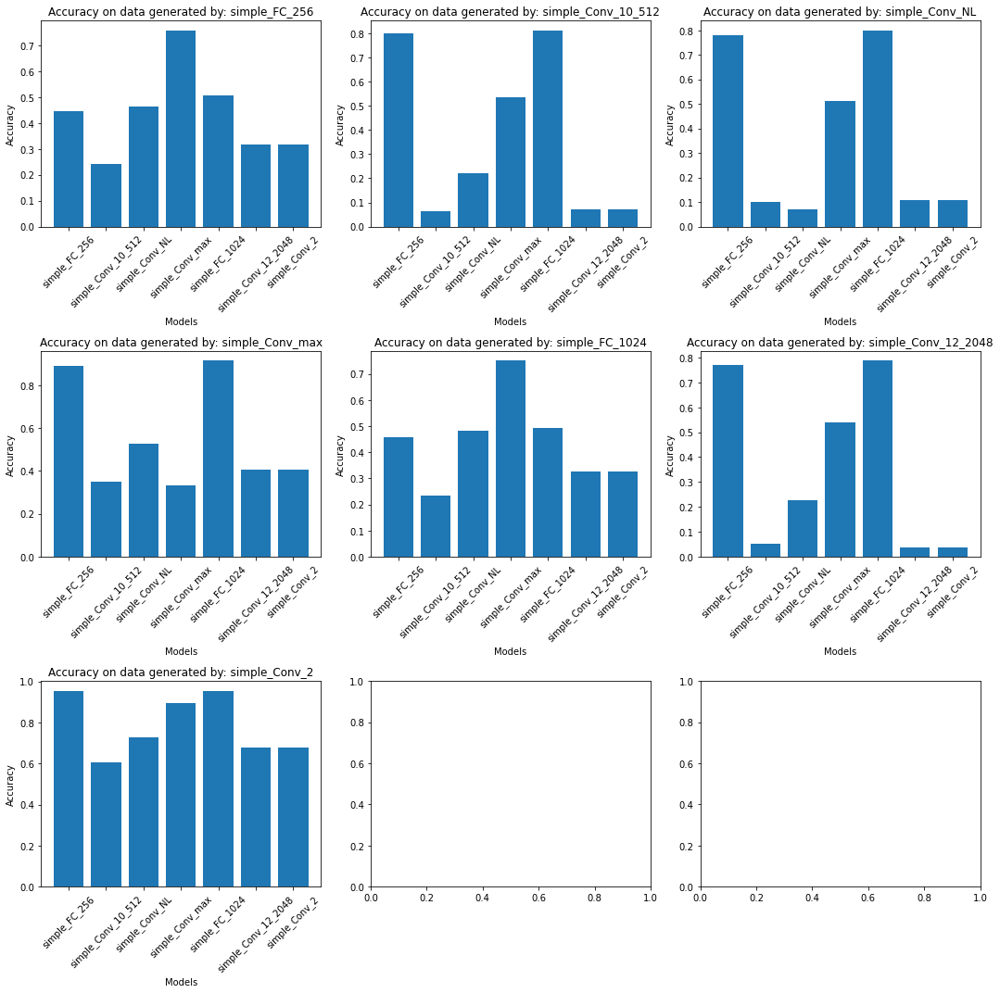

In [32]:

fig, axes = plt.subplots(3, 3, figsize=(15,15))

axes = axes.flatten()
for i, (model_name, model_data) in enumerate(accuracy_data_0_1_pgd.items()):
    models = list(model_data.keys())
    accuracies = [item[0][2] for item in model_data.values()]
    ax = axes[i]
    ax.bar(models, accuracies)
    ax.set_xlabel('Models')
    ax.set_ylabel('Accuracy')
    ax.set_title(f'Accuracy on data generated by: {model_name}')
    ax.tick_params(axis='x', rotation=45)

plt.tight_layout()
plt.show()

Instead of a fixed epsilon, let's plot for all epsilons.

In [52]:
norm_ = np.inf
data_type_ = "test"
epsilons = {
    attack_params[0][0]: attack_params[0][1],
    attack_params[1][0]: attack_params[1][1]
}
accuracy_data_pgd = {model_name: {model: [] for model in model_names.keys()} for model_name in model_names.keys()}
adversarial_data_x = {}
adversarial_data_y = {}
for original_model in model_names:
    for (model_name, norm, epsilon, data_type), (model, data) in attack_data.items():
        if (model_name, norm, data_type) == (original_model, norm_, data_type_):
            adversarial_data_x[original_model,epsilon] = data[f'x_{data_type}_attack']
            adversarial_data_y[original_model,epsilon] = data[f'y_{data_type}_attack']
        else:
            continue

for original_model in tqdm(model_names):
    for (model_name, norm, epsilon, data_type), (model, data) in attack_data.items():
        if data_type == data_type_ and norm == norm_:
            model = model[0]
            predictions = model.predict(adversarial_data_x[original_model,epsilon], verbose=0)
            accuracy = np.sum(np.argmax(predictions, axis=1) == np.argmax(adversarial_data_y[original_model,epsilon], axis=1)) / len(adversarial_data_y[original_model,epsilon])
            accuracy_data_pgd[original_model][model_name].append((norm, epsilon, accuracy))
        else:
            continue

100%|██████████| 7/7 [18:33<00:00, 159.05s/it]


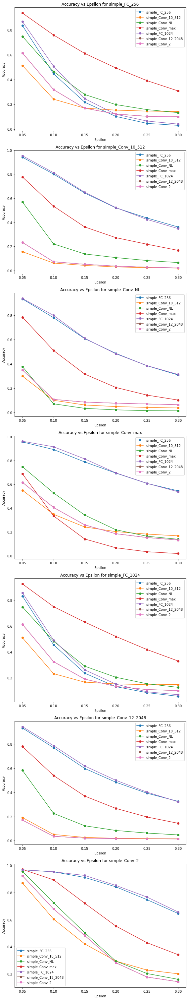

In [58]:
# Plotting the accuracies for different epsilons
fig, axes = plt.subplots(len(model_names), 1, figsize=(8, 6*len(model_names)))

for i, (original_model, model_data) in enumerate(accuracy_data_pgd.items()):
    ax = axes[i]
    for model_name, accuracies in model_data.items():
        epsilons = [entry[1] for entry in accuracies]
        accuracy_values = [entry[2] for entry in accuracies]
        ax.plot(epsilons, accuracy_values, marker='o', label=model_name)
    ax.set_xlabel('Epsilon')
    ax.set_ylabel('Accuracy')
    ax.set_title(f'Accuracy vs Epsilon for {original_model}')
    ax.legend()

plt.tight_layout()
plt.show()

<u> We will go back to this in the extension part. Overall we can say that the FC models are robust against the CNN attack data (which is to be expected). And the more similar the architecture of the models the more transferable is the attack data, with the max pooling model being an outlier for this. </u>

### <h3 style="background-color:#2eff54;color:black;text-align: center;padding-top: 5px;padding-bottom: 5px;border-radius: 15px 50px;"><strong><centre>Adversarial Robustness  on  MNIST 2</centre></strong></h3>

<u>This part is also not a reproduction, it's more of a verification produced using full_mnist_gpu.py. Where we used the FGM attack instead of the PGD norm = 2 (for the FGM we produced the attack on the full data, as it's much faster to produce). We will also see the models, their accuracies and losses for the training. For the pgd we didn't limit the iterations to 10 but to 100 and we left the other parameters to default.</u>

In [12]:
model_names = {'simple_FC_256':simple_FC, 'simple_Conv_10_512':simple_Conv, 'simple_Conv_NL':simple_Conv_NL, 'simple_Conv_max':simple_Conv_max,
               'simple_FC_1024':simple_FC, 'simple_Conv_12_2048':simple_Conv}
LRZ = False
if LRZ:
    base_path = "/dss/dsshome1/lxc0C/apdl010/Analysis-of-new-phenomena-in-deep-learning/Reproduction"
else:
    base_path =  "models/mnist_2"

simple_FC_256 = tf.keras.models.load_model(base_path + '/mnist_model_0.h5', compile=False)
simple_Conv_10_512 = tf.keras.models.load_model(base_path+'/mnist_model_1.h5', compile=False )
simple_Conv_NL = tf.keras.models.load_model(base_path+'/mnist_model_2.h5', compile=False )
simple_Conv_max   = tf.keras.models.load_model(base_path+'/mnist_model_3.h5', compile=False )
simple_FC_1024 = tf.keras.models.load_model(base_path+'/mnist_model_4.h5', compile=False )
simple_Conv_12_2048 = tf.keras.models.load_model(base_path+'/mnist_model_5.h5', compile=False )

with open(base_path + '/mnist_acc_array.pkl', 'rb') as file:
    acc_array = pickle.load(file)
with open(base_path + '/mnist_loss_array.pkl', 'rb') as file:
    loss_array = pickle.load(file)


models = [simple_FC_256, simple_Conv_10_512, simple_Conv_NL, simple_Conv_max, simple_FC_1024,simple_Conv_12_2048]
models = [[models[i]] + [acc_array[i][0]] + [acc_array[i][1]] + [loss_array[i][0]] + [loss_array[i][1]] for i in range(len(models))]

<u> Now, let's check the models and the losses and accuracies </u>

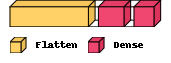

In [14]:
InteractiveShell.ast_node_interactivity = "all"
visualkeras.layered_view(simple_FC_256, legend=True)

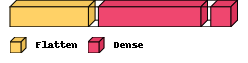

In [15]:
visualkeras.layered_view(simple_FC_1024, legend=True)

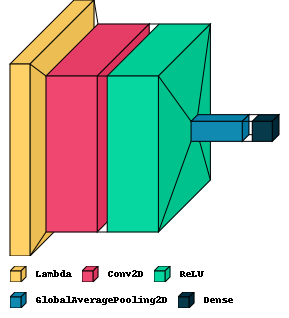

In [16]:
visualkeras.layered_view(simple_Conv_10_512, legend=True)

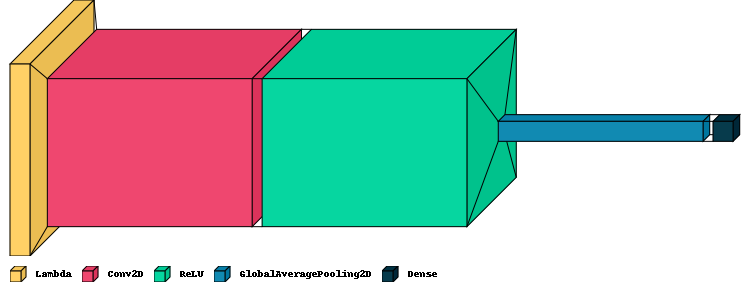

In [17]:
visualkeras.layered_view(simple_Conv_12_2048, legend=True)

In [18]:
InteractiveShell.ast_node_interactivity = "last_expr"

In [19]:
import plotly.graph_objects as go
import plotly.io as pio

fig_traces = []
for model_name, (_, test_acc, train_acc,_,_) in zip(model_names.keys(), models):
    trace_train = go.Scatter(x=np.arange(len(train_acc)), y=train_acc, mode='lines', name=f'{model_name} (Train)')
    trace_test = go.Scatter(x=np.arange(len(test_acc)), y=test_acc, mode='lines', name=f'{model_name} (Test)')
    fig_traces.extend([trace_train, trace_test])
layout = go.Layout(
    xaxis=dict(title='Epoch'),
    yaxis=dict(title='Accuracy'),
    title='Training and Validation Accuracy',
    showlegend=True
)
fig = go.Figure(data=fig_traces, layout=layout)
pio.show(fig)

In [20]:
fig_traces = []
for model_name, (_,_,_,test_loss,train_loss) in zip(model_names.keys(), models):
    trace_train = go.Scatter(x=np.arange(len(train_loss)), y=train_loss, mode='lines', name=f'{model_name} (Train)')
    trace_test = go.Scatter(x=np.arange(len(test_loss)), y=test_loss, mode='lines', name=f'{model_name} (Test)')
    fig_traces.extend([trace_train, trace_test])
layout = go.Layout(
    xaxis=dict(title='Epoch'),
    yaxis=dict(title='Loss'),
    title='Training and Validation Loss',
    showlegend=True
)
fig = go.Figure(data=fig_traces, layout=layout)
pio.show(fig)

#### Testing on attack data

In [104]:
base_path =  "data/mnist_adversarial_data"

# Load the attack data
attack_data = {}
attack_params =  [[np.inf, [0.05, 0.1,  0.15, 0.2, 0.25, 0.3]],[2, [0.5, 1, 1.5,  2.5, 3]]]

for model_name, model in zip(model_names,models):
    for norm, epsilons in attack_params:
        for epsilon in epsilons:
            for data_type in ["train", "test"]:
                if norm == np.inf:
                    attack_name = "ProjectedGradientDescentTensorFlowV2"
                else:
                    attack_name = "FastGradientMethod"
                file_name = base_path + f"/{model_name}_{attack_name}_{epsilon}_{data_type}.npz"
                try:
                    attack_data[(model_name, norm, epsilon,data_type)] = (model,np.load(file_name))
                except FileNotFoundError:
                    print(file_name + " data not found ")

In [105]:
norms = [attack_params[0][0], attack_params[1][0]]
epsilons = {
    attack_params[0][0]: attack_params[0][1],
    attack_params[1][0]: attack_params[1][1]
}
# Getting accuracies on normal data (epsilon = 0 as a notation)
accuracy_data = {norm: {model: [] for model in list(model_names.keys())} for norm in norms}
for (model_name, norm, epsilon, data_type), (model, data) in tqdm(attack_data.items()):
    if data_type == "test":
        model = model[0]
        predictions = model.predict(x_test,verbose=0)
        accuracy = np.sum(np.argmax(predictions, axis=1) == np.argmax(y_test, axis=1)) / len(y_test)
        accuracy_data[norm][model_name].append((0, accuracy))
    else:
        continue
# Getting accuracies on adversarial data (epsilon > 0)
for (model_name, norm, epsilon, data_type), (model, data) in tqdm(attack_data.items()):
    if data_type == "test":
        model = model[0]
        predictions = model.predict(data[f'x_{data_type}_attack'],verbose=0)
        accuracy = np.sum(np.argmax(predictions, axis=1) == np.argmax(data[f'y_{data_type}_attack'], axis=1)) / len(data[f'y_{data_type}_attack'])
        accuracy_data[norm][model_name].append((epsilon, accuracy))
    else:
        continue

100%|██████████| 132/132 [12:30<00:00,  5.69s/it]


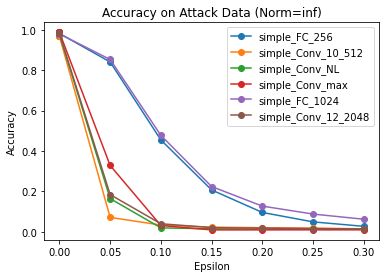

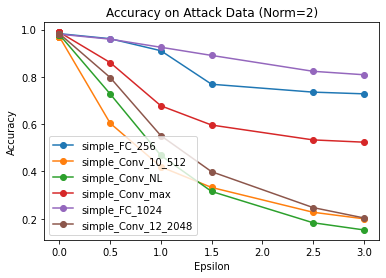

In [106]:
for norm in norms:
    plt.figure()
    for model_name in model_names:
        accuracies = accuracy_data[norm][model_name]
        eps, accs = zip(*accuracies)
        plt.plot(eps, accs, marker='o', label=model_name)
    plt.xlabel('Epsilon')
    plt.ylabel('Accuracy')
    plt.title(f"Accuracy on Attack Data (Norm={norm})")
    plt.legend()
    plt.show()

In [107]:
import plotly.graph_objects as go
for norm in norms:
    fig = go.Figure()
    for model_name in model_names:
        accuracies = accuracy_data[norm][model_name]
        eps, accs = zip(*accuracies)
        # Set the line style based on the model name
        line_dash = 'solid' if 'FC' not in model_name else 'dash'
        fig.add_trace(go.Scatter(x=eps, y=accs, mode='lines+markers', name=model_name, line=dict(dash=line_dash)))
    fig.update_layout(
        xaxis_title='Epsilon',
        yaxis_title='Accuracy',
        title=f'Accuracy on Attack Data (Norm={norm})',
        showlegend=True
    )
    fig.show()

The same observations hold for these different parameters and also for the FastGradientMethod attack (noted here as norm=2).

### <h3 style="background-color:#56cbf9;color:white;text-align: center;padding-top: 5px;padding-bottom: 5px;border-radius: 15px 50px;"><strong><centre>Adversarial Robustness  on Fashion MNIST</centre></strong></h3>

Here we will use the [Fashion-MNIST](https://arxiv.org/abs/1708.07747) dataset.
We created the models and attack data using scripts/full_fashion_mnist_gpu_2.py. Using [LRZ](https://www.lrz.de/) with [DGX-1 P100 Architecture](https://doku.lrz.de/1-general-description-and-resources-10746641.html) (4 to 16 gpus). For the created attack data we used x_train[:10000] and x_test[:5000].

Briefly here is what we do:
   1. Data preprocessing.
   2. Checks the available GPUs and use them if they are available.
   3. Train the models, the same training was used as mnist. As described in the paper: All models were trained for 20 epochs using the ADAM optimizer, with a batch size of 200 and learning rate of 0.01. The learning rate is decreased by a factor of 10 at the 10th and 15th epoch.
   4. Store abd save the trained models, accuracy, and loss.

For the attack data creation:
   1. Data loading
   2. Loads pre-trained models. (if used scripts/fashion_mnist_gpu_create_attack_data.py otherwise we continue to the attack directly)
   3. Performs ART attacks on the models using different attack parameters.
   4. Generates and save the adversarial examples for each model and attack parameter combination.


In [2]:
fashion_mnist = tf.keras.datasets.fashion_mnist
(x_train, y_train), (x_test, y_test) = fashion_mnist.load_data()
x_train = x_train / 255.0
x_test = x_test / 255.0
x_train = x_train.reshape(-1, 28, 28, 1)
x_test = x_test.reshape(-1, 28, 28, 1)
# Convert the labels to one-hot encoding
y_train = tf.keras.utils.to_categorical(y_train, num_classes=10)
y_test = tf.keras.utils.to_categorical(y_test, num_classes=10)

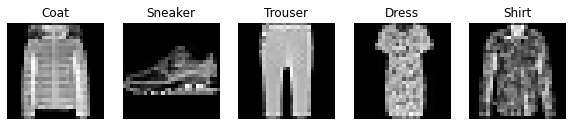

In [3]:
class_names = ['T-shirt/top', 'Trouser', 'Pullover', 'Dress', 'Coat', 'Sandal',
               'Shirt', 'Sneaker', 'Bag', 'Ankle boot']


num_images = 5
random_indexes = np.random.choice(len(x_test), num_images, replace=False)
images = x_test[random_indexes]
labels = y_test[random_indexes]

plt.figure(figsize=(10, 5))
for i in range(num_images):
    plt.subplot(1, num_images, i+1)
    plt.imshow(images[i].reshape(28, 28), cmap='gray')
    plt.title(class_names[np.argmax(labels[i])])
    plt.axis('off')

plt.show()

The used models below are similar to the ones used with mnist.
Here is a brief introduction to the models:
- Simple_FC_X_Y: simple_FC_2_256
    - A simple FCN that consists of X hidden layers each of size Y.
    - The input images are flattened into a vector and passed through the hidden layer with ReLU activation.
- simple_Conv_X_Y:
    - A convolutional neural network (CNN) with circular padding.
    - It performs circular padding on the input images to handle border effects during convolution.
    - The model includes a convolutional layer of size Y and of kernel size X followed by a ReLU activation then by Global average pooling.
- Simple_Conv_NL:
    - This model is similar to Simple_Conv but does not use circular padding, NL: for no lambda layer.
    - It directly applies convolution on the input images without additional padding.
    - Then ReLU and Global average pooling.
- Simple_Conv_max:
    - This model is also a CNN architecture with max pooling instead of global average pooling.
The output layer for all these models consists of 10 units, corresponding to the 10 classes in the MNIST dataset.
<u>And here we will introduce some new architectures that were not used in the mnist experiment:</u>
- Simple_Conv_2:
    - A CNN architecture with two convolutional layers followed by max pooling.
    - It consists of two sets of a convolutional layer with a 3x3 kernel and ReLU activation, followed by max pooling with a 2x2 window.
    The output is flattened and passed through two dense layers with ReLU activation, and the final layer has 10 units with a softmax activation.
- Simple_FC_2:
    - This model is an FCN with multiple layers.
- Simple__RNN:
    -This model is a recurrent neural network (RNN) architecture using LSTM (Long Short-Term Memory) layers.
    - The input images are reshaped into a sequence of 28 timesteps, each representing a row of pixels.
    - The model includes two LSTM layers, one returning sequences and the other returning the final output.
    - The final layer has 10 units with a softmax activation.

The models used in the paper are: simple_FC_2_256, simple_Conv_10_512, simple_FC_3_512':simple_FC and simple_Conv_12_2048.

In [4]:
from tensorflow.keras.layers import LSTM, MaxPooling2D,Reshape
def circular_padding(x, padding_size):
    # Perform circular padding on the input tensor
    return tf.pad(x, [[0, 0], [padding_size, padding_size], [padding_size, padding_size], [0, 0]], mode='SYMMETRIC')

def simple_Conv(n_hidden, kernel_size=10, padding_size=-1):
    if padding_size == -1:
        padding_size = kernel_size // 2

    model = Sequential()
    model.add(Lambda(lambda x: circular_padding(x, padding_size), input_shape=(28, 28, 1)))
    model.add(Conv2D(n_hidden, kernel_size=kernel_size, padding='same'))
    model.add(ReLU())
    model.add(GlobalAveragePooling2D())
    model.add(Dense(10))

    return model

def simple_FC(n_hidden, n_units = 2):
    model = Sequential()
    model.add(Flatten(input_shape=(28, 28)))
    for i in range(n_units):
        model.add(Dense(n_hidden, activation="relu"))
    model.add(Dense(10))

    return model

def simple_Conv_NL(n_hidden,kernel_size=10):
    """ no lambda """
    model = Sequential()
    model.add(Conv2D(n_hidden, kernel_size=kernel_size, padding='valid', input_shape=(28, 28, 1), activation='relu'))
    model.add(GlobalAveragePooling2D())
    model.add(Dense(10))

    return model

def simple_Conv_max(n_hidden, kernel_size=10,padding_size=0):
    model = Sequential()
    model.add(Lambda(lambda x: circular_padding(x, padding_size), input_shape=(28, 28, 1)))
    model.add(Conv2D(n_hidden, kernel_size=kernel_size, padding='same', activation='relu'))
    model.add(GlobalMaxPooling2D())
    model.add(Dense(10))

    return model

def simple_Conv_2():
    model = Sequential()
    model.add(Conv2D(32, (3, 3), activation='relu', input_shape=(28, 28, 1)))
    model.add(MaxPooling2D((2, 2)))
    model.add(Conv2D(64, (3, 3), activation='relu'))
    model.add(MaxPooling2D((2, 2)))
    model.add(Flatten())
    model.add(Dense(128, activation='relu'))
    model.add(Dense(10))

    return model

def simple_FC_2():
    model = Sequential()
    model.add(Flatten(input_shape=(28, 28)))
    model.add(Dense(256, activation='relu'))
    model.add(Dense(128, activation='relu'))
    model.add(Dense(64, activation='relu'))
    model.add(Dense(10))

    return model


def simple__RNN():
    model = Sequential()
    model.add(Reshape((28, 28), input_shape=(28, 28, 1)))
    model.add(LSTM(128, return_sequences=True))
    model.add(LSTM(128))
    model.add(Dense(10))

    return model

In [5]:
LRZ = False
if LRZ:
    base_path = "/dss/dsshome1/lxc0C/apdl010/Analysis-of-new-phenomena-in-deep-learning/Reproduction"
else:
    base_path =  "models/fashion_mnist_main"
simple_FC_2_256 = tf.keras.models.load_model(base_path + '/fashion_mnist_simple_FC_2_256.h5', compile=False)
simple_Conv_10_512 = tf.keras.models.load_model(base_path+'/fashion_mnist_simple_Conv_10_512.h5', compile=False )
simple_Conv_NL = tf.keras.models.load_model(base_path+'/fashion_mnist_simple_Conv_NL.h5', compile=False )
simple_Conv_max   = tf.keras.models.load_model(base_path+'/fashion_mnist_simple_Conv_max.h5', compile=False )
simple_FC_3_512 = tf.keras.models.load_model(base_path+'/fashion_mnist_simple_FC_3_512.h5', compile=False )
simple_Conv_12_2048 = tf.keras.models.load_model(base_path+'/fashion_mnist_simple_Conv_12_2048.h5', compile=False )
simple__RNN =  tf.keras.models.load_model(base_path+'/fashion_mnist_simple__RNN.h5', compile=False )
simple_FC_2 =  tf.keras.models.load_model(base_path+'/fashion_mnist_simple_FC_2.h5', compile=False )
simple_Conv_2 =  tf.keras.models.load_model(base_path+'/fashion_mnist_simple_Conv_2.h5', compile=False )

model_names = {'simple_FC_2_256':simple_FC, 'simple_Conv_10_512':simple_Conv, 'simple_Conv_NL':simple_Conv_NL,
               'simple_Conv_max':simple_Conv_max, 'simple_FC_3_512':simple_FC, 'simple_Conv_12_2048':simple_Conv,
               'simple__RNN':simple__RNN , 'simple_FC_2':simple_FC_2, 'simple_Conv_2':simple_Conv_2}


models = [simple_FC_2_256, simple_Conv_10_512, simple_Conv_NL, simple_Conv_max, simple_FC_3_512,simple_Conv_12_2048, simple__RNN,simple_FC_2,simple_Conv_2]
models = [[models[i]] for i in range(len(models))]

In [6]:
base_path =  "data/fashion_adversarial_data_2"

# Load the attack data
attack_data = {}
attack_params =  [[np.inf, [0.05, 0.1,  0.15, 0.2, 0.25, 0.3]],[2, [0.5, 1, 1.5,  2.5, 3]]]

attack_name = "ProjectedGradientDescentTensorFlowV2"
for model_name, model in zip(model_names,models):
    for norm, epsilons in attack_params:
        for epsilon in epsilons:
            for data_type in ["train", "test"]:
                file_name = base_path + f"/2_{model_name}_{attack_name}_{epsilon}_{data_type}.npz"
                try:
                    attack_data[(model_name, norm, epsilon,data_type)] = (model,np.load(file_name))
                except FileNotFoundError:
                    print(file_name + " data not found ")

In [28]:
norms = [attack_params[0][0], attack_params[1][0]]
epsilons = {
    attack_params[0][0]: attack_params[0][1],
    attack_params[1][0]: attack_params[1][1]
}
# Getting accuracies on normal data (epsilon = 0 as a notation)
accuracy_data = {norm: {model: [] for model in list(model_names.keys())} for norm in norms}
for (model_name, norm, epsilon, data_type), (model, data) in tqdm(attack_data.items()):
    if data_type == "test":
        model = model[0]
        predictions = model.predict(x_test,verbose=0)
        accuracy = np.sum(np.argmax(predictions, axis=1) == np.argmax(y_test, axis=1)) / len(y_test)
        accuracy_data[norm][model_name].append((0, accuracy))
    else:
        continue
# Getting accuracies on adversarial data (epsilon > 0)
for (model_name, norm, epsilon, data_type), (model, data) in tqdm(attack_data.items()):
    if data_type == "test":
        model = model[0]
        predictions = model.predict(data[f'x_{data_type}_attack'],verbose=0)
        accuracy = np.sum(np.argmax(predictions, axis=1) == np.argmax(data[f'y_{data_type}_attack'], axis=1)) / len(data[f'y_{data_type}_attack'])
        accuracy_data[norm][model_name].append((epsilon, accuracy))
    else:
        continue

100%|██████████| 198/198 [13:41<00:00,  4.15s/it]


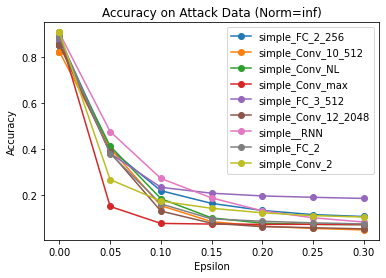

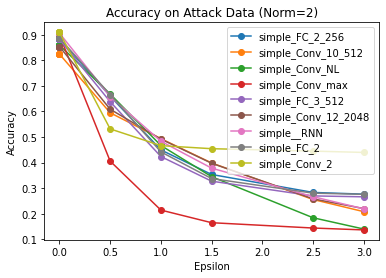

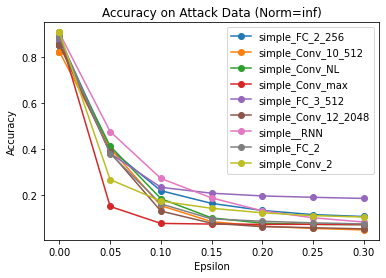

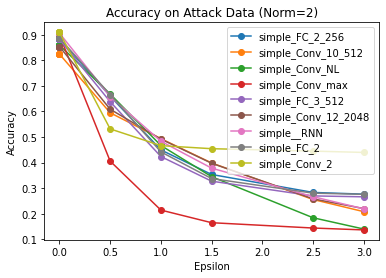

In [30]:
for norm in norms:
    plt.figure()
    for model_name in model_names:
        accuracies = accuracy_data[norm][model_name]
        eps, accs = zip(*accuracies)
        plt.plot(eps, accs, marker='o', label=model_name)
    plt.xlabel('Epsilon')
    plt.ylabel('Accuracy')
    plt.title(f"Accuracy on Attack Data (Norm={norm})")
    plt.legend()
    plt.show()

In [31]:
for norm in norms:
    fig = go.Figure()
    for model_name in model_names:
        accuracies = accuracy_data[norm][model_name]
        eps, accs = zip(*accuracies)

        # Set the line style based on the model name
        line_dash = 'solid' if 'FC' not in model_name else 'dash'
        fig.add_trace(go.Scatter(x=eps, y=accs, mode='lines+markers', name=model_name, line=dict(dash=line_dash)))
    fig.update_layout(
        xaxis_title='Epsilon',
        yaxis_title='Accuracy',
        title=f'Accuracy on Attack Data (Norm={norm})',
        showlegend=True
    )

    fig.show()

In [7]:
from tabulate import tabulate
from functions.utils import evaluate_shift_consistency

model_consistency_dict = evaluate_shift_consistency(models,list(model_names.keys()), x_test)

simple_FC_2_256


100%|██████████| 100/100 [00:02<00:00, 44.97it/s]


simple_Conv_10_512


100%|██████████| 100/100 [00:36<00:00,  2.77it/s]


simple_Conv_NL


100%|██████████| 100/100 [00:07<00:00, 13.93it/s]


simple_Conv_max


100%|██████████| 100/100 [00:11<00:00,  8.53it/s]


simple_FC_3_512


100%|██████████| 100/100 [00:03<00:00, 32.42it/s]


simple_Conv_12_2048


100%|██████████| 100/100 [04:16<00:00,  2.56s/it]


simple__RNN


100%|██████████| 100/100 [00:10<00:00,  9.94it/s]


simple_FC_2


100%|██████████| 100/100 [00:02<00:00, 39.49it/s]


simple_Conv_2


100%|██████████| 100/100 [00:03<00:00, 29.72it/s]


In [8]:

table = []
for model_name, model_consistency in model_consistency_dict.items():
    table.append([model_name, "{:.2f}%".format(100. * model_consistency)])

headers = ["Model Name", "Consistency"]
print(tabulate(table, headers, tablefmt="grid"))

+---------------------+---------------+
| Model Name          | Consistency   |
+=====================+===============+
| simple_FC_2_256     | 36.45%        |
+---------------------+---------------+
| simple_Conv_10_512  | 54.91%        |
+---------------------+---------------+
| simple_Conv_NL      | 58.05%        |
+---------------------+---------------+
| simple_Conv_max     | 54.32%        |
+---------------------+---------------+
| simple_FC_3_512     | 37.90%        |
+---------------------+---------------+
| simple_Conv_12_2048 | 58.02%        |
+---------------------+---------------+
| simple__RNN         | 43.86%        |
+---------------------+---------------+
| simple_FC_2         | 29.00%        |
+---------------------+---------------+
| simple_Conv_2       | 30.64%        |
+---------------------+---------------+


The difference isn't very large here (still for the models used in the paper the scores are smaller for the FCNsthan for the CNNs).
If the consistency score should be inversely related to the invariance, then the order of robustness should be:
simple_FC_2, simple_Conv_2, simple_FC_2_256,simple_FC_3_512, simple__RNN, simple_Conv_max,simple_Conv_10_512, simple_Conv_12_2048,simple_Conv_NL
While the actual order of robustness for example for norm=∞ and epsilon=3:
simple_Conv_2,simple_FC_2, simple_FC_2_256,simple_FC_3_512,simple_Conv_12_2048, simple__RNN, ,simple_Conv_10_512, ,simple_Conv_NL,simple_Conv_max

The models used in the paper, respect this order.

### <h3 style="background-color:#2eff54;color:black;text-align: center;padding-top: 5px;padding-bottom: 5px;border-radius: 15px 50px;"><strong><centre>Adversarial Robustness  on Fashion MNIST 2</centre></strong></h3>

This part is also not a reproduction, just like we did with MNIST 2, it’s a verification. We created the models here using scripts/fashion_mnist_gpu_create_models.py and created the attack data for those models using scripts/fashion_mnist_gpu_create_attack_data.py. Where we used the FGM attack instead of the PGD norm = 2 (for the FGM we produced the attack on the full data, as it’s much faster to produce). We will also see the models, their accuracies and losses for the training. For the pgd we didn’t limit the iterations to 10 but to 100 and we left the other parameters to default

In [51]:
LRZ = False
if LRZ:
    base_path = "/dss/dsshome1/lxc0C/apdl010/Analysis-of-new-phenomena-in-deep-learning/Reproduction"
else:
    base_path =  "models/fashion_mnist_2"
simple_FC = tf.keras.models.load_model(base_path + '/model_0.h5', compile=False)
simple_Conv = tf.keras.models.load_model(base_path+'/model_1.h5', compile=False )
simple_Conv_NL = tf.keras.models.load_model(base_path+'/model_2.h5', compile=False )
simple_Conv_max   = tf.keras.models.load_model(base_path+'/model_3.h5', compile=False )
simple_FC_ = tf.keras.models.load_model(base_path+'/model_4.h5', compile=False )
simple_Conv_ = tf.keras.models.load_model(base_path+'/model_5.h5', compile=False )
simple__RNN =  tf.keras.models.load_model(base_path+'/model_6.h5', compile=False )
simple_FC_2 =  tf.keras.models.load_model(base_path+'/model_7.h5', compile=False )
simple_Conv_2 =  tf.keras.models.load_model(base_path+'/model_8.h5', compile=False )

with open(base_path + '/acc_array.pkl', 'rb') as file:
    acc_array = pickle.load(file)
with open(base_path + '/loss_array.pkl', 'rb') as file:
    loss_array = pickle.load(file)


models = [simple_FC, simple_Conv, simple_Conv_NL, simple_Conv_max, simple_FC_,simple_Conv_, simple__RNN,simple_FC_2,simple_Conv_2]
models = [[models[i]] + [acc_array[i][0]] + [acc_array[i][1]] + [loss_array[i][0]] + [loss_array[i][1]] for i in range(len(models))]

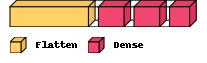

In [55]:
visualkeras.layered_view(simple_FC, legend=True)

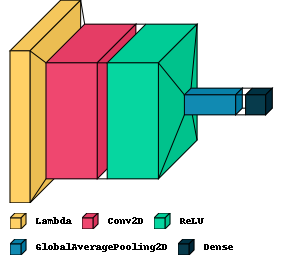

In [60]:
visualkeras.layered_view(simple_Conv, legend=True)

In [52]:
attack_params = [[np.inf, [0.05, 0.1,  0.15, 0.2, 0.25, 0.3]],[2, [0.5, 1, 1.5,  2.5, 3]]]
model_names = {'simple_FC_2_256':simple_FC, 'simple_Conv_10_512':simple_Conv, 'simple_Conv_NL':simple_Conv_NL,
               'simple_Conv_max':simple_Conv_max, 'simple_FC_3_512':simple_FC, 'simple_Conv_12_2048':simple_Conv,'simple__RNN':simple__RNN , 'simple_FC_2':simple_FC_2, 'simple_Conv_2':simple_Conv_2}


In [53]:
import plotly.graph_objects as go
import plotly.io as pio

fig_traces = []
for model_name, (_, test_acc, train_acc,_,_) in zip(model_names.keys(), models):
    trace_train = go.Scatter(x=np.arange(len(train_acc)), y=train_acc, mode='lines', name=f'{model_name} (Train)')
    trace_test = go.Scatter(x=np.arange(len(test_acc)), y=test_acc, mode='lines', name=f'{model_name} (Test)')
    fig_traces.extend([trace_train, trace_test])
layout = go.Layout(
    xaxis=dict(title='Epoch'),
    yaxis=dict(title='Accuracy'),
    title='Training and Validation Accuracy',
    showlegend=True
)
fig = go.Figure(data=fig_traces, layout=layout)
pio.show(fig)

In [54]:
fig_traces = []
for model_name, (_,_,_,test_loss,train_loss) in zip(model_names.keys(), models):
    trace_train = go.Scatter(x=np.arange(len(train_loss)), y=train_loss, mode='lines', name=f'{model_name} (Train)')
    trace_test = go.Scatter(x=np.arange(len(test_loss)), y=test_loss, mode='lines', name=f'{model_name} (Test)')
    fig_traces.extend([trace_train, trace_test])
layout = go.Layout(
    xaxis=dict(title='Epoch'),
    yaxis=dict(title='Loss'),
    title='Training and Validation Loss',
    showlegend=True
)
fig = go.Figure(data=fig_traces, layout=layout)
pio.show(fig)


#### Testing on attack data

In [63]:
base_path =  "data/adversarial_fashion_data"

# Load the attack data
attack_data = {}
attack_params =  [[np.inf, [0.05, 0.1,  0.15, 0.2, 0.25, 0.3]],[2, [0.5, 1, 1.5,  2.5, 3]]]
model_names = {'simple_FC':simple_FC, 'simple_Conv':simple_Conv, 'simple_Conv_NL':simple_Conv_NL,
               'simple_Conv_max':simple_Conv_max, 'simple_FC_':simple_FC, 'simple_Conv_':simple_Conv,
               'simple__RNN':simple__RNN , 'simple_FC_2':simple_FC_2, 'simple_Conv_2':simple_Conv_2}
for model_name, model in zip(model_names,models):
    for norm, epsilons in attack_params:
        for epsilon in epsilons:
            for data_type in ["train", "test"]:
                if norm == np.inf:
                    attack_name = "ProjectedGradientDescentTensorFlowV2"
                else:
                    attack_name = "FastGradientMethod"
                file_name = base_path + f"/{model_name}_{attack_name}_{epsilon}_{data_type}.npz"
                try:
                    attack_data[(model_name, norm, epsilon,data_type)] = (model,np.load(file_name))
                except FileNotFoundError:
                    print(file_name + " data not found ")

###### On test data:

In [68]:
norms = [attack_params[0][0], attack_params[1][0]]
epsilons = {
    attack_params[0][0]: attack_params[0][1],
    attack_params[1][0]: attack_params[1][1]
}
# Getting accuracies on normal data (epsilon = 0 as a notation)
accuracy_data = {norm: {model: [] for model in list(model_names.keys())} for norm in norms}
for (model_name, norm, epsilon, data_type), (model, data) in tqdm(attack_data.items()):
    if data_type == "test":
        model = model[0]
        predictions = model.predict(x_test,verbose=0)
        accuracy = np.sum(np.argmax(predictions, axis=1) == np.argmax(y_test, axis=1)) / len(y_test)
        accuracy_data[norm][model_name].append((0, accuracy))
    else:
        continue
# Getting accuracies on adversarial data (epsilon > 0)
for (model_name, norm, epsilon, data_type), (model, data) in tqdm(attack_data.items()):
    if data_type == "test":
        model = model[0]
        predictions = model.predict(data[f'x_{data_type}_attack'],verbose=0)
        accuracy = np.sum(np.argmax(predictions, axis=1) == np.argmax(data[f'y_{data_type}_attack'], axis=1)) / len(data[f'y_{data_type}_attack'])
        accuracy_data[norm][model_name].append((epsilon, accuracy))
    else:
        continue

100%|██████████| 198/198 [05:01<00:00,  1.52s/it]


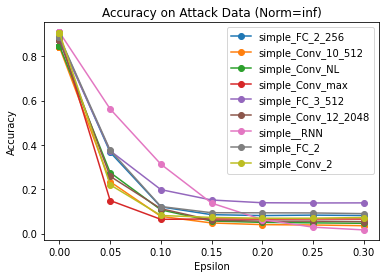

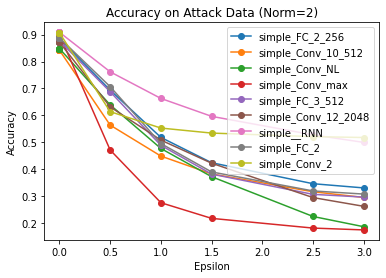

In [73]:
model_names = {'simple_FC': simple_FC, 'simple_Conv': simple_Conv, 'simple_Conv_NL': simple_Conv_NL,
               'simple_Conv_max': simple_Conv_max, 'simple_FC_': simple_FC, 'simple_Conv_': simple_Conv,
               'simple__RNN': simple__RNN, 'simple_FC_2': simple_FC_2, 'simple_Conv_2': simple_Conv_2}

for norm in norms:
    plt.figure()
    for model_name in model_names:
        accuracies = accuracy_data[norm][model_name]
        if model_name == 'simple_FC':
            model_name = 'simple_FC_2_256'
        if model_name == 'simple_FC_':
            model_name = 'simple_FC_3_512'
        if model_name == 'simple_Conv':
            model_name = 'simple_Conv_10_512'
        if model_name == 'simple_Conv_':
            model_name = 'simple_Conv_12_2048'
        eps, accs = zip(*accuracies)
        plt.plot(eps, accs, marker='o', label=model_name)
    plt.xlabel('Epsilon')
    plt.ylabel('Accuracy')
    plt.title(f"Accuracy on Attack Data (Norm={norm})")
    plt.legend()
    plt.show()

In [74]:
import plotly.graph_objects as go

for norm in norms:
    fig = go.Figure()
    for model_name in model_names:
        accuracies = accuracy_data[norm][model_name]
        eps, accs = zip(*accuracies)
        if model_name == 'simple_FC':
            model_name = 'simple_FC_2_256'
        if model_name == 'simple_FC_':
            model_name = 'simple_FC_3_512'
        if model_name == 'simple_Conv':
            model_name = 'simple_Conv_10_512'
        if model_name == 'simple_Conv_':
            model_name = 'simple_Conv_12_2048'
        # Set the line style based on the model name
        line_dash = 'solid' if 'FC' not in model_name else 'dash'
        fig.add_trace(go.Scatter(x=eps, y=accs, mode='lines+markers', name=model_name, line=dict(dash=line_dash)))
    fig.update_layout(
        xaxis_title='Epsilon',
        yaxis_title='Accuracy',
        title=f'Accuracy on Attack Data (Norm={norm})',
        showlegend=True
    )
    fig.show()

The difference between the FCNs and the CNNs (that are used in the paper) is hard to distinguish compared to MNIST dataset. Which is expected as it's the case for the results of the paper. Except for epsilon bigger than one, for norm 2 (there is almost no difference).
<u> Some observations that can be explored during the extension phase: max pooling here has the worst robustness. Conv_2 is still robust even for this dataset. And RNN is the most robust.</u>

###### On training data:

In [75]:
accuracy_data = {norm: {model: [] for model in list(model_names.keys())} for norm in norms}
for (model_name, norm, epsilon, data_type), (model, data) in tqdm(attack_data.items()):
    if data_type == "train":
        model = model[0]
        predictions = model.predict(x_train, verbose = 0)
        accuracy = np.sum(np.argmax(predictions, axis=1) == np.argmax(y_train, axis=1)) / len(y_train)
        accuracy_data[norm][model_name].append((0, accuracy))
    else:
        continue
for (model_name, norm, epsilon, data_type), (model, data) in tqdm(attack_data.items()):
    if data_type == "train":
        model = model[0]
        predictions = model.predict(data[f'x_{data_type}_attack'], verbose = 0)
        accuracy = np.sum(np.argmax(predictions, axis=1) == np.argmax(data[f'y_{data_type}_attack'], axis=1)) / len(data[f'y_{data_type}_attack'])
        accuracy_data[norm][model_name].append((epsilon, accuracy))
    else:
        continue

100%|██████████| 198/198 [12:24<00:00,  3.76s/it]


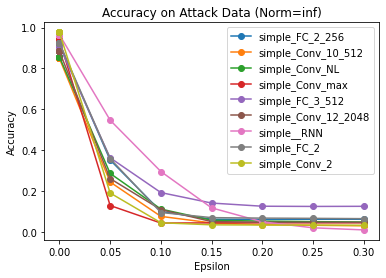

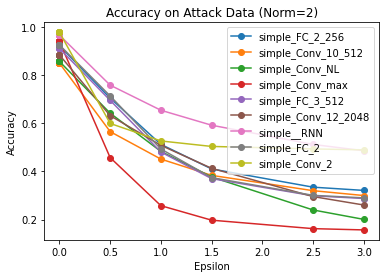

In [76]:
for norm in norms:
    plt.figure()
    for model_name in model_names:
        accuracies = accuracy_data[norm][model_name]
        if model_name == 'simple_FC':
            model_name = 'simple_FC_2_256'
        if model_name == 'simple_FC_':
            model_name = 'simple_FC_3_512'
        if model_name == 'simple_Conv':
            model_name = 'simple_Conv_10_512'
        if model_name == 'simple_Conv_':
            model_name = 'simple_Conv_12_2048'
        eps, accs = zip(*accuracies)
        plt.plot(eps, accs, marker='o', label=model_name)
    plt.xlabel('Epsilon')
    plt.ylabel('Accuracy')
    plt.title(f"Accuracy on Attack Data (Norm={norm})")
    plt.legend()
    plt.show()

In [77]:
for norm in norms:
    fig = go.Figure()
    for model_name in model_names:
        accuracies = accuracy_data[norm][model_name]
        eps, accs = zip(*accuracies)
        if model_name == 'simple_FC':
            model_name = 'simple_FC_2_256'
        if model_name == 'simple_FC_':
            model_name = 'simple_FC_3_512'
        if model_name == 'simple_Conv':
            model_name = 'simple_Conv_10_512'
        if model_name == 'simple_Conv_':
            model_name = 'simple_Conv_12_2048'
        # Set the line style based on the model name
        line_dash = 'solid' if 'FC' not in model_name else 'dash'
        fig.add_trace(go.Scatter(x=eps, y=accs, mode='lines+markers', name=model_name, line=dict(dash=line_dash)))
    fig.update_layout(
        xaxis_title='Epsilon',
        yaxis_title='Accuracy',
        title=f'Accuracy on Attack Data (Norm={norm})',
        showlegend=True
    )

    fig.show()

##### Shift Invariance

In [80]:
shifts = range(10, -11, -1)
results = []

for model, model_name in zip(models, model_names):
    model = model[0]
    accuracy_axis0 = evaluate_shift_invariance(model, x_test, y_test, shifts, axis=0)
    accuracy_axis1 = evaluate_shift_invariance(model, x_test, y_test, shifts, axis=1)
    if model_name == 'simple_FC':
        model_name = 'simple_FC_2_256'
    if model_name == 'simple_FC_':
        model_name = 'simple_FC_3_512'
    if model_name == 'simple_Conv':
        model_name = 'simple_Conv_10_512'
    if model_name == 'simple_Conv_':
        model_name = 'simple_Conv_12_2048'
    results.append((model_name, accuracy_axis0, accuracy_axis1))

100%|██████████| 21/21 [00:35<00:00,  1.70s/it]


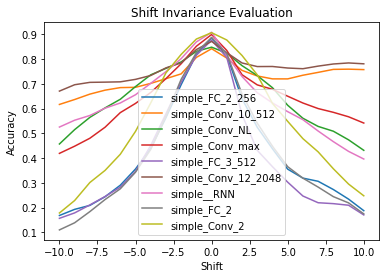

In [88]:

#fig, axes = plt.subplots(nrows=2, ncols=1, figsize=(8, 10))
for model_name, accuracy_axis0, accuracy_axis1 in results:
    #axes[0].plot(shifts, accuracy_axis0, label=model_name)
    plt.plot(shifts, accuracy_axis1, label=model_name)

plt.xlabel('Shift')
plt.ylabel('Accuracy')
plt.legend()
plt.title('Shift Invariance Evaluation')
#fig = plt.figure(figsize=(20, 20))
#plt.tight_layout()
plt.show()

In [89]:
fig = go.Figure()
for model_name, accuracy_axis0, accuracy_axis1 in results:
    shifts_abs = []
    results_abs_k = []
    for k in range(len(shifts) // 2 + 1):
        shifts_abs.append(shifts[k])
        results_abs_k.append((accuracy_axis1[k] + accuracy_axis1[-k - 1]) / 2)
        line_dash = 'solid' if 'FC' not in model_name else 'dash'
    fig.add_trace(go.Scatter(x=shifts_abs, y=results_abs_k, mode='lines', name=model_name, line=dict(dash=line_dash)))
fig.update_layout(
    xaxis=dict(title='Shift'),
    yaxis=dict(title='Accuracy'),
    title='Shift Invariance Evaluation',
    showlegend=True
)
fig.show()

### <h3 style="background-color:#2eff54;color:black;text-align: center;padding-top: 5px;padding-bottom: 5px;border-radius: 15px 50px;"><strong><centre>Shift invariance and padding</centre></strong></h3>

<u> This part is to compare Shift invariance and padding size </u>. We used scripts/padding_plot.py to train the models. We trained different models using different padding sizes. To check the training accuracy and loss, you can use tensorboard and .logs folder.
Here are the models that were trained:

In [4]:
import os

base_path = "data/padding/padding_experiment"
accuracy_data_path = os.path.join(base_path, "accuracy_data.pkl")

with open(accuracy_data_path, "rb") as f:
    accuracy_data = pickle.load(f)
def circular_padding(x, padding_size):
    return tf.pad(x, [[0, 0], [padding_size, padding_size], [padding_size, padding_size], [0, 0]], mode='SYMMETRIC')

models_ = []
model_names_ = []
model_dir = base_path
for filename in os.listdir(model_dir):
    if filename.endswith(".h5"):
        model_path = os.path.join(model_dir, filename)
        model = tf.keras.models.load_model(model_path, compile=False)
        models_.append(model)
        model_names_.append(filename[:-3])  # Remove the ".h5" extension from the filename


In [5]:
print("The trained models:")
print(model_names_)

The trained models:
['simple_Conv_0_2048', 'simple_Conv_0_512', 'simple_Conv_10_2048', 'simple_Conv_10_512', 'simple_Conv_14_2048', 'simple_Conv_14_512', 'simple_Conv_2_2048', 'simple_Conv_2_512', 'simple_Conv_4_2048', 'simple_Conv_4_512', 'simple_Conv_6_2048', 'simple_Conv_6_512', 'simple_Conv_8_2048', 'simple_Conv_8_512', 'simple_Conv_NL', 'simple_FC_2_256', 'simple_FC_3_256']


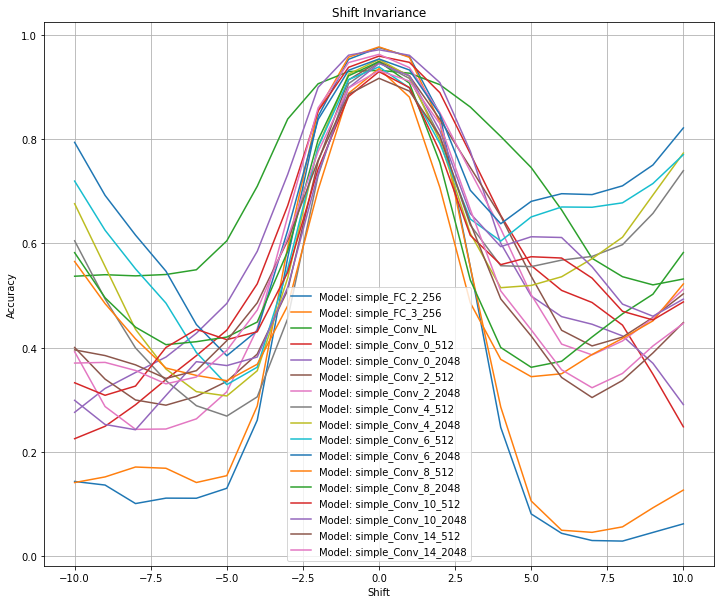

In [61]:
# Plot the accuracy related to shift
import matplotlib.pyplot as plt

shifts = list(range(10, -11, -1))
plt.figure(figsize=(12, 10))
for model_name, accuracy_axis in accuracy_data.items():
    plt.plot(shifts, accuracy_axis, label=f"Model: {model_name}")

plt.title(f"Shift Invariance")
plt.xlabel("Shift")
plt.ylabel("Accuracy")
plt.legend()
plt.grid(True)
plt.show()

In [63]:
import plotly.graph_objects as go

shifts = list(range(10, -11, -1))
fig = go.Figure()
for model_name, accuracy_axis in accuracy_data.items():
    fig.add_trace(go.Scatter(x=shifts, y=accuracy_axis, mode='lines', name=f"Model: {model_name}"))

fig.update_layout(
    title=f"Shift Invariance ",
    xaxis_title="Shift",
    yaxis_title="Accuracy",
    legend=dict(x=0, y=1),
    xaxis=dict(showgrid=True, gridwidth=1, gridcolor='lightgray'),
    yaxis=dict(showgrid=True, gridwidth=1, gridcolor='lightgray'),
    width=800,
    height=600
)
fig.show()

In [64]:
fig = go.Figure()

for model_name, accuracy_axis in accuracy_data.items():
    shifts_abs = []
    results_abs_k = []
    for k in range(len(shifts) // 2 + 1):
        shifts_abs.append(shifts[k])
        results_abs_k.append((accuracy_axis[k] + accuracy_axis[-k - 1]) / 2)
        line_dash = 'solid' if 'FC' not in model_name else 'dash'
    fig.add_trace(go.Scatter(x=shifts_abs, y=results_abs_k, mode='lines', name=model_name, line=dict(dash=line_dash)))

fig.update_layout(
    xaxis=dict(title='Shift'),
    yaxis=dict(title='Accuracy'),
    title='Shift Invariance Evaluation',
    showlegend=True
)

fig.show()

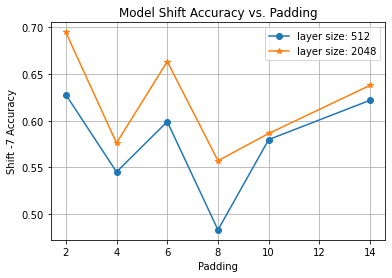

In [6]:
from functions.utils import extract_padding
accuracy__values = []
padding_values = []
accuracy__values_ = []
padding_values_ = []
for model_name, accuracy_axis in accuracy_data.items():
    shift = 7
    padding = extract_padding(model_name)
    if padding == 0:
        continue
    layer_size = int(model_name.split('_')[3])
    if layer_size == 512:
        padding_values.append(padding)
        accuracy__values.append((accuracy_axis[shift] + accuracy_axis[-shift - 1]) / 2)
    if layer_size == 2048:
        padding_values_.append(padding)
        accuracy__values_.append((accuracy_axis[shift] + accuracy_axis[-shift - 1]) / 2)

# Plot the data
plt.plot(padding_values, accuracy__values, 'o-', label="layer size: 512" )
plt.plot(padding_values_, accuracy__values_, '*-', label="layer size: 2048" )
plt.xlabel('Padding')
plt.ylabel(f'Shift -{shift} Accuracy')
plt.title('Model Shift Accuracy vs. Padding')
plt.legend()
plt.grid(True)
plt.show()

We can't really conclude that higher padding makes the model more shift invariant.

Now let's use the paper's consistency score method. First let's plot examples of the shifts

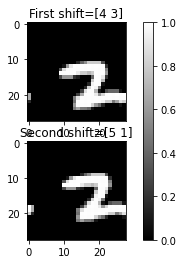

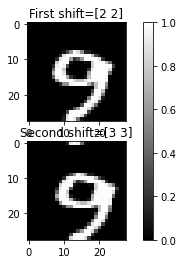

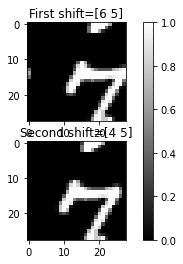

In [87]:
from functions.utils import plot_shift_examples
plot_shift_examples(x_test,n=3)

In [91]:
models_ = [[_] for _ in models_]
model_consistency_dict = evaluate_shift_consistency(models_,model_names_, x_test,10)

simple_Conv_0_2048


100%|██████████| 100/100 [00:07<00:00, 13.95it/s]


simple_Conv_0_512


100%|██████████| 100/100 [00:04<00:00, 23.78it/s]


simple_Conv_10_2048


100%|██████████| 100/100 [00:13<00:00,  7.57it/s]


simple_Conv_10_512


100%|██████████| 100/100 [00:06<00:00, 16.38it/s]


simple_Conv_14_2048


100%|██████████| 100/100 [00:17<00:00,  5.71it/s]


simple_Conv_14_512


100%|██████████| 100/100 [00:07<00:00, 13.70it/s]


simple_Conv_2_2048


100%|██████████| 100/100 [00:06<00:00, 15.64it/s]


simple_Conv_2_512


100%|██████████| 100/100 [00:04<00:00, 21.58it/s]


simple_Conv_4_2048


100%|██████████| 100/100 [00:08<00:00, 11.52it/s]


simple_Conv_4_512


100%|██████████| 100/100 [00:05<00:00, 16.77it/s]


simple_Conv_6_2048


100%|██████████| 100/100 [00:09<00:00, 10.49it/s]


simple_Conv_6_512


100%|██████████| 100/100 [00:04<00:00, 20.37it/s]


simple_Conv_8_2048


100%|██████████| 100/100 [00:11<00:00,  8.44it/s]


simple_Conv_8_512


100%|██████████| 100/100 [00:05<00:00, 18.22it/s]


simple_Conv_NL


100%|██████████| 100/100 [00:05<00:00, 19.79it/s]


simple_FC_2_256


100%|██████████| 100/100 [00:03<00:00, 27.33it/s]


simple_FC_3_256


100%|██████████| 100/100 [00:04<00:00, 23.73it/s]


In [92]:
table = []
for model_name, model_consistency in model_consistency_dict.items():
    padding = extract_padding(model_name)
    table.append([model_name, padding, "{:.2f}%".format(100. * model_consistency)])

# Table headers
headers = ["Model Name", "Padding", "Consistency"]
# Print the table
print(tabulate(table, headers, tablefmt="grid"))

+---------------------+-----------+---------------+
| Model Name          |   Padding | Consistency   |
+=====================+===========+===============+
| simple_Conv_0_2048  |         0 | 59.77%        |
+---------------------+-----------+---------------+
| simple_Conv_0_512   |         0 | 56.89%        |
+---------------------+-----------+---------------+
| simple_Conv_10_2048 |        10 | 50.25%        |
+---------------------+-----------+---------------+
| simple_Conv_10_512  |        10 | 51.04%        |
+---------------------+-----------+---------------+
| simple_Conv_14_2048 |        14 | 45.54%        |
+---------------------+-----------+---------------+
| simple_Conv_14_512  |        14 | 45.76%        |
+---------------------+-----------+---------------+
| simple_Conv_2_2048  |         2 | 42.44%        |
+---------------------+-----------+---------------+
| simple_Conv_2_512   |         2 | 43.79%        |
+---------------------+-----------+---------------+
| simple_Con

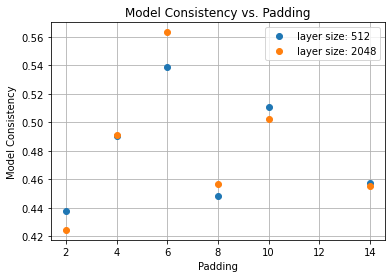

In [98]:
# Create dicts for padding and consistency values
padding_values = {"512":[],"2048":[]}
consistency_values = {"512":[],"2048":[]}

# Populate the lists
for model_name, model_consistency in model_consistency_dict.items():
    padding = extract_padding(model_name)
    if padding == 0:
        continue
    layer_size = model_name.split('_')[3]
    padding_values[layer_size].append(padding)
    consistency_values[layer_size].append(model_consistency)

# Plot the data
plt.plot(padding_values["512"], consistency_values["512"], 'o', label="layer size: 512" )
plt.plot(padding_values["2048"], consistency_values["2048"], 'o', label="layer size: 2048" )
plt.xlabel('Padding')
plt.ylabel('Model Consistency')
plt.title('Model Consistency vs. Padding')
plt.legend()
plt.grid(True)
plt.show()

Same conclusion as with the shifting method.

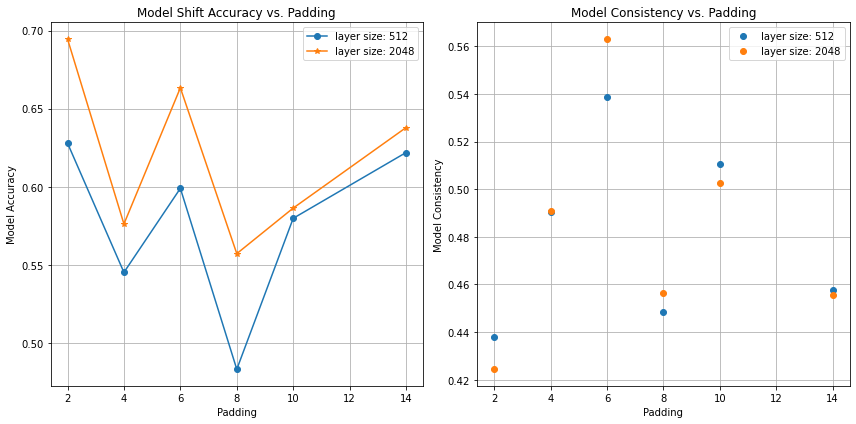

In [104]:
fig, axes = plt.subplots(1, 2, figsize=(12, 6))
axes[0].plot(padding_values_, accuracy__values, 'o-', label="layer size: 512" )
axes[0].plot(padding_values_, accuracy__values_, '*-', label="layer size: 2048" )
axes[0].set_xlabel('Padding')
axes[0].set_ylabel('Model Accuracy')
axes[0].set_title('Model Shift Accuracy vs. Padding')
axes[0].legend()
axes[0].grid(True)
axes[1].plot(padding_values["512"], consistency_values["512"], 'o', label="layer size: 512" )
axes[1].plot(padding_values["2048"], consistency_values["2048"], 'o', label="layer size: 2048" )
axes[1].set_xlabel('Padding')
axes[1].set_ylabel('Model Consistency')
axes[1].set_title('Model Consistency vs. Padding')
axes[1].legend()
axes[1].grid(True)
plt.tight_layout()
plt.show()


In [22]:
padding_values = {"512": [], "2048": []}
consistency_values = {"512": [], "2048": []}

# Populate the lists
data_manual = [
    ("simple_Conv_0_2048", 0, 59.77),
    ("simple_Conv_0_512", 0, 56.89),
    ("simple_Conv_10_2048", 10, 50.25),
    ("simple_Conv_10_512", 10, 51.04),
    ("simple_Conv_14_2048", 14, 45.54),
    ("simple_Conv_14_512", 14, 45.76),
    ("simple_Conv_2_2048", 2, 42.44),
    ("simple_Conv_2_512", 2, 43.79),
    ("simple_Conv_4_2048", 4, 49.09),
    ("simple_Conv_4_512", 4, 49.05),
    ("simple_Conv_6_2048", 6, 56.31),
    ("simple_Conv_6_512", 6, 53.89),
    ("simple_Conv_8_2048", 8, 45.63),
    ("simple_Conv_8_512", 8, 44.83),
    ("simple_Conv_NL", 0, 69.28),
    ("simple_FC_2_256", 0, 27.23),
    ("simple_FC_3_256", 0, 31.72)
]

for model_name, padding, consistency in data_manual:
    layer_size = model_name.split("_")[-1]
    if model_names_[0].split("_")[1]!="Conv" or padding == 0:
        continue
    if layer_size in padding_values:
        padding_values[layer_size].append(padding)
        consistency_values[layer_size].append(consistency)


In [17]:
padding_values_ = {"512": padding_values_, "2048":padding_values_}
consistency_values_ = {"512": accuracy__values, "2048": accuracy__values_}

In [15]:
consistency_values

{'512': [56.89, 51.04, 45.76, 43.79, 49.05, 53.89, 44.83],
 '2048': [59.77, 50.25, 45.54, 42.44, 49.09, 56.31, 45.63]}

In [20]:
print(padding_values_,consistency_values_)

{'512': [2, 4, 6, 8, 10, 14], '2048': [2, 4, 6, 8, 10, 14]} {'512': [0.62795, 0.5451, 0.59895, 0.483, 0.57975, 0.6218999999999999], '2048': [0.6947, 0.5761000000000001, 0.66335, 0.5570999999999999, 0.5863, 0.6379]}


In [23]:
print(padding_values,consistency_values)

{'512': [10, 14, 2, 4, 6, 8], '2048': [10, 14, 2, 4, 6, 8]} {'512': [51.04, 45.76, 43.79, 49.05, 53.89, 44.83], '2048': [50.25, 45.54, 42.44, 49.09, 56.31, 45.63]}


[10 14  2  4  6  8] [51.04 45.76 43.79 49.05 53.89 44.83]
[2 3 4 5 0 1]
[2, 4, 6, 8, 10, 14]
[62.795 54.51  59.895 48.3   57.975 62.19 ]
[0 1 2 3 4 5]
[43.79 49.05 53.89 44.83 51.04 45.76] [62.795 54.51  59.895 48.3   57.975 62.19 ]


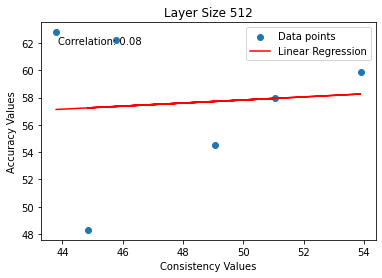

[10 14  2  4  6  8] [50.25 45.54 42.44 49.09 56.31 45.63]
[2 3 4 5 0 1]
[2, 4, 6, 8, 10, 14]
[69.47  57.61  66.335 55.71  58.63  63.79 ]
[0 1 2 3 4 5]
[42.44 49.09 56.31 45.63 50.25 45.54] [69.47  57.61  66.335 55.71  58.63  63.79 ]


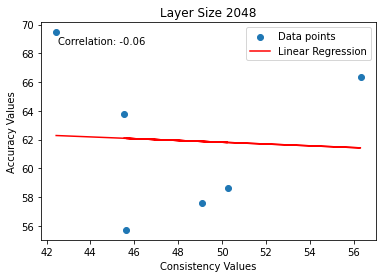

In [26]:
import matplotlib.pyplot as plt
import numpy as np
from scipy.stats import linregress


for layer_size in padding_values.keys():
    x = np.array(padding_values[layer_size])
    y = np.array(consistency_values[layer_size])
    print(x,y)

    sorted_indices = np.argsort(x)
    print(sorted_indices)
    x_sorted = x[sorted_indices]
    y_sorted = y[sorted_indices]


    y_ = np.array(consistency_values_[layer_size])*100
    print(padding_values_[layer_size])
    print(y_)
    sorted_indices = np.argsort(padding_values_[layer_size])
    print(sorted_indices)
    y_sorted_ = y_[sorted_indices]
    print(y_sorted,y_sorted_)
    # Perform linear regression
    slope, intercept, r_value, p_value, std_err = linregress(y_sorted, y_sorted_)
    line = slope * y_sorted + intercept


    plt.scatter(y_sorted, y_sorted_, label="Data points")
    plt.plot(y_sorted, line, color='red', label="Linear Regression")
    plt.xlabel("Consistency Values")
    plt.ylabel("Accuracy Values")
    plt.title(f"Layer Size {layer_size}")
    plt.legend()

    # Add correlation coefficient to the plot
    plt.text(0.05, 0.9, f"Correlation: {r_value:.2f}", transform=plt.gca().transAxes)


    plt.show()


In [ ]:
padding_values = {"512":[],"2048":[]}
consistency_values = {"512":[],"2048":[]}

In [28]:
from functions.utils import evaluate_shift_consistency_accuracy
from art.utils import load_mnist
models_ = [[_] for _ in models_]
(x_train, y_train), (x_test, y_test), min_pixel_value, max_pixel_value = load_mnist()
model_consistency_dict, model_accuracy_dict = evaluate_shift_consistency_accuracy(models_,model_names_, x_test,y_test,10)

simple_Conv_0_2048


100%|██████████| 100/100 [00:39<00:00,  2.53it/s]


simple_Conv_0_512


100%|██████████| 100/100 [00:09<00:00, 10.61it/s]


simple_Conv_10_2048


100%|██████████| 100/100 [03:09<00:00,  1.89s/it]


simple_Conv_10_512


100%|██████████| 100/100 [00:28<00:00,  3.55it/s]


simple_Conv_14_2048


100%|██████████| 100/100 [04:49<00:00,  2.90s/it]


simple_Conv_14_512


100%|██████████| 100/100 [00:41<00:00,  2.39it/s]


simple_Conv_2_2048


100%|██████████| 100/100 [00:48<00:00,  2.08it/s]


simple_Conv_2_512


100%|██████████| 100/100 [00:14<00:00,  7.07it/s]


simple_Conv_4_2048


100%|██████████| 100/100 [01:10<00:00,  1.41it/s]


simple_Conv_4_512


100%|██████████| 100/100 [00:15<00:00,  6.37it/s]


simple_Conv_6_2048


100%|██████████| 100/100 [01:35<00:00,  1.05it/s]


simple_Conv_6_512


100%|██████████| 100/100 [00:18<00:00,  5.30it/s]


simple_Conv_8_2048


100%|██████████| 100/100 [02:13<00:00,  1.34s/it]


simple_Conv_8_512


100%|██████████| 100/100 [00:25<00:00,  3.99it/s]


simple_Conv_NL


100%|██████████| 100/100 [00:16<00:00,  6.18it/s]


simple_FC_2_256


100%|██████████| 100/100 [00:04<00:00, 20.88it/s]


simple_FC_3_256


100%|██████████| 100/100 [00:04<00:00, 21.10it/s]


In [34]:
model_consistency_dict, model_accuracy_dict = evaluate_shift_consistency_accuracy(models_,model_names_, x_test,y_test,10)

simple_Conv_0_2048


100%|██████████| 100/100 [00:35<00:00,  2.84it/s]


simple_Conv_0_512


100%|██████████| 100/100 [00:12<00:00,  8.17it/s]


simple_Conv_10_2048


100%|██████████| 100/100 [03:26<00:00,  2.07s/it]


simple_Conv_10_512


100%|██████████| 100/100 [00:25<00:00,  3.90it/s]


simple_Conv_14_2048


100%|██████████| 100/100 [04:11<00:00,  2.52s/it]


simple_Conv_14_512


100%|██████████| 100/100 [00:35<00:00,  2.78it/s]


simple_Conv_2_2048


100%|██████████| 100/100 [00:41<00:00,  2.42it/s]


simple_Conv_2_512


100%|██████████| 100/100 [00:09<00:00, 10.44it/s]


simple_Conv_4_2048


100%|██████████| 100/100 [01:12<00:00,  1.37it/s]


simple_Conv_4_512


100%|██████████| 100/100 [00:23<00:00,  4.29it/s]


simple_Conv_6_2048


100%|██████████| 100/100 [01:38<00:00,  1.02it/s]


simple_Conv_6_512


100%|██████████| 100/100 [00:19<00:00,  5.17it/s]


simple_Conv_8_2048


100%|██████████| 100/100 [02:14<00:00,  1.34s/it]


simple_Conv_8_512


100%|██████████| 100/100 [00:22<00:00,  4.43it/s]


simple_Conv_NL


100%|██████████| 100/100 [00:16<00:00,  6.10it/s]


simple_FC_2_256


100%|██████████| 100/100 [00:04<00:00, 24.96it/s]


simple_FC_3_256


100%|██████████| 100/100 [00:04<00:00, 23.42it/s]


In [43]:
model_consistency_dict.values()

dict_values([0.5974, 0.5668, 0.5047, 0.506, 0.4557, 0.4587, 0.4315, 0.4322, 0.4979, 0.4947, 0.5634, 0.5413, 0.4612, 0.4407, 0.6796, 0.2777, 0.3181])

In [44]:
np.array(list(model_consistency_dict.values()))

array([0.5974, 0.5668, 0.5047, 0.506 , 0.4557, 0.4587, 0.4315, 0.4322,
       0.4979, 0.4947, 0.5634, 0.5413, 0.4612, 0.4407, 0.6796, 0.2777,
       0.3181])

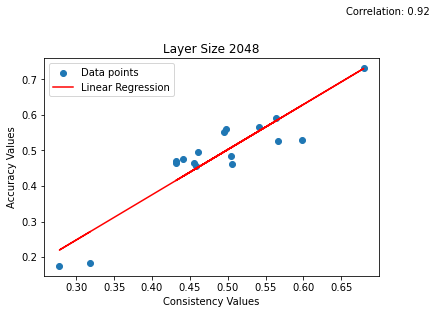

In [47]:

y_sorted = np.array(list(model_consistency_dict.values()))
y_sorted_ = np.array(list(model_accuracy_dict.values()))
# Perform linear regression
slope, intercept, r_value, p_value, std_err = linregress(y_sorted, y_sorted_)
line = slope * y_sorted + intercept


plt.scatter(y_sorted, y_sorted_, label="Data points")
plt.plot(y_sorted, line, color='red', label="Linear Regression")
plt.xlabel("Consistency Values")
plt.ylabel("Accuracy Values")
plt.title(f"Layer Size {layer_size}")
plt.legend()

# Add correlation coefficient to the plot
plt.text(0.9, 1.2, f"Correlation: {r_value:.2f}", transform=plt.gca().transAxes)


plt.show()

### <h3 style="background-color:#2eff54;color:black;text-align: center;padding-top: 5px;padding-bottom: 5px;border-radius: 15px 50px;"><strong><centre>Bibliography & Extension</centre></strong></h3>

### Extension

While trying to understand and reproduce the results of the paper, we added multiple verifications and little tweaks (mini-extensions). The goal is to continue exploring the outliers or unexpected results. RNN structures or transformers. The transferability of the attacks and maybe some defense to the attacks.

### Bibiography

   - Singla, Vasu, et al. Shift Invariance Can Reduce Adversarial Robustness. ArXiv.org,22 Nov 2021 https://arxiv.org/pdf/2103.02695.pdf.

   - Alireza, et al. “Revisiting DeepFool: Generalization and Improvement.” ArXiv.org, 22 Mar. 2023, arxiv.org/abs/2303.12481, https://doi.org/10.48550/arXiv.2303.12481.

   - Rony, Jérôme, et al. “Decoupling Direction and Norm for Efficient Gradient-Based L2 Adversarial Attacks and Defenses.” ArXiv.org, 3 Apr. 2019, arxiv.org/abs/1811.09600.

   - Xiao, Han, et al. “Fashion-MNIST: A Novel Image Dataset for Benchmarking Machine Learning Algorithms.” ArXiv:1708.07747 [Cs, Stat], 15 Sept. 2017, arxiv.org/abs/1708.07747.

   - Zhang, Richard. “Making Convolutional Networks Shift-Invariant Again.” ArXiv.org, 8 June 2019, arxiv.org/abs/1904.11486.

   - “Welcome to the Adversarial Robustness Toolbox — Adversarial Robustness Toolbox 1.7.0 Documentation.” Adversarial-Robustness-Toolbox.readthedocs.io, adversarial-robustness-toolbox.readthedocs.io/en/latest/.

   - “Trusted-AI/Adversarial-Robustness-Toolbox.” GitHub, 1 July 2021, github.com/Trusted-AI/adversarial-robustness-toolbox.